In [1]:
import os 
import cv2
import json
import copy
import numpy as np
import tensorflow as tf

from mtcnn import MTCNN
from train_model import *
from matplotlib import pyplot as plt
from visualise import *
from tensorflow.keras.models import load_model

In [2]:
IS_R = True
IS_O = False
FOLDER  = 'train'

POS_OVERLAP_T = 0.60    
NEG_OVERLAP_T = 0.30

if IS_R == False and IS_O == False:
    TAR_DIR = 'r_hard_sample'
elif IS_R == True and IS_O == False:
    TAR_DIR = 'o_hard_sample'

In [3]:
mtcnn = MTCNN(face_t = [0.3, 0.5, 0.7])
mtcnn.pnet = load_model('best_pnet.h5') 
mtcnn.rnet = load_model('best_rnet.h5') 
mtcnn.onet = load_model('best_onet.h5')

Metal device set to: Apple M1


2023-03-29 07:43:49.561234: I tensorflow/core/common_runtime/pluggable_device/pluggable_device_factory.cc:305] Could not identify NUMA node of platform GPU ID 0, defaulting to 0. Your kernel may not have been built with NUMA support.
2023-03-29 07:43:49.561359: I tensorflow/core/common_runtime/pluggable_device/pluggable_device_factory.cc:271] Created TensorFlow device (/job:localhost/replica:0/task:0/device:GPU:0 with 0 MB memory) -> physical PluggableDevice (device: 0, name: METAL, pci bus id: <undefined>)


In [4]:
root = os.path.join('data', FOLDER, 'face')
lab_path = os.listdir(root)
lab_path = [file for file in lab_path if file.split('.')[-1] == 'json']

In [5]:
print(lab_path[0:5])

['81085c8c-c90c-11ed-9720-a2d46b2f7ca3-3.json', '819b51fe-c90c-11ed-9720-a2d46b2f7ca3-8.json', '825a8e70-c90c-11ed-9720-a2d46b2f7ca3-0.json', '82282f7a-c90c-11ed-9720-a2d46b2f7ca3-2.json', '81d047e2-c90c-11ed-9720-a2d46b2f7ca3-1.json']


In [6]:
try_dict = {}
for lab_load in lab_path:
    
    uid = (lab_load.split('.')[0]).split('-')
    uid = '-'.join(uid[0:len(uid) - 1])
    
    if uid in try_dict:
        continue
    else:
        try_dict[uid] = True
    
    lab_load = os.path.join('raw', uid + '.json')
    img_load = os.path.join('raw', uid + '.jpg')
    
    print('uid: ', uid)
    print('img_load: ', img_load)
    print('lab_load: ', lab_load)
    
    lab = json.load(open(lab_load, 'r'))
    img = cv2.cvtColor(cv2.imread(img_load), cv2.COLOR_BGR2RGB)
    boxes = copy.deepcopy(lab['boxes'])       
    results = mtcnn.detect_faces(img, is_r = IS_R, is_o = IS_O)
    
    if results is not None:
        img = cv2.imread(img_load)
        
        overlap = np.zeros((results.shape[0], len(boxes)))
        for i in range(results.shape[0]):
            for j in range(len(boxes)):
                overlap[i, j] = compute_IOU(results[i], boxes[j])

        m_overlap = np.max(overlap, axis = 1)
        pos_ind = np.where(m_overlap >= POS_OVERLAP_T)[0]
        
        neg_num = 0
        for i in range(results.shape[0]):
            
            px1, py1, px2, py2 = results[i, 0:4]
            px1, py1, px2, py2 = int(px1), int(py1), int(px2), int(py2)
            px1, py1 = np.max([0, px1]), np.max([0, py1])
            px2, py2 = np.min([img.shape[1], px2]), np.min([img.shape[0], py2])
            
            bbox_id = np.argmax(overlap[i, :])
            bx1, by1, bx2, by2 = boxes[bbox_id]


            crop_img = img[py1:py2, px1:px2, :].copy()
            
            annotation = {}
            if m_overlap[i] <= NEG_OVERLAP_T and neg_num < len(pos_ind):
                img_save = os.path.join(TAR_DIR, FOLDER, 'non_face', uid + f'-{i}.jpg')
                lab_save = os.path.join(TAR_DIR, FOLDER, 'non_face', uid + f'-{i}.json')

                annotation["data_path"] = os.path.join('raw', uid + '.jpg')
                annotation['box'] = [0,0,0,0]
                annotation['class'] = 0
                annotation['is_have'] = 0
                annotation['left_eye'] = [0,0]
                annotation['right_eye'] = [0,0]
                annotation['nose'] = [0,0]
                annotation['mouth_left'] = [0,0]
                annotation['mouth_right'] = [0,0]
                neg_num += 1
                
                cv2.imwrite(img_save, crop_img)
                with open(lab_save, 'w') as f:
                    json.dump(annotation, f)
            elif m_overlap[i] >= POS_OVERLAP_T:
                img_save = os.path.join(TAR_DIR, FOLDER, 'face', uid + f'-{i}.jpg')
                lab_save = os.path.join(TAR_DIR, FOLDER, 'face', uid + f'-{i}.json')
                
                annotation["data_path"] = os.path.join('raw', uid + '.jpg')
                annotation['box'] = [(bx1 - px1)/crop_img.shape[1], 
                                     (by1 - py1)/crop_img.shape[0], 
                                     (bx2 - px1)/crop_img.shape[1], 
                                     (by2 - py1)/crop_img.shape[0]]
                annotation['class'] = 1
                annotation['is_have'] = lab['keypoints'][bbox_id]['is_have']
                if annotation['is_have'] == 1:
                    annotation['left_eye'] = [(lab['keypoints'][bbox_id]['left_eye'][0] - px1)/crop_img.shape[1], 
                                              (lab['keypoints'][bbox_id]['left_eye'][1] - py1)/crop_img.shape[0]]
                    annotation['right_eye'] = [(lab['keypoints'][bbox_id]['right_eye'][0] - px1)/crop_img.shape[1], 
                                               (lab['keypoints'][bbox_id]['right_eye'][1] - py1)/crop_img.shape[0]] 
                    annotation['nose'] = [(lab['keypoints'][bbox_id]['nose'][0] - px1)/crop_img.shape[1], 
                                          (lab['keypoints'][bbox_id]['nose'][1] - py1)/crop_img.shape[0]]
                    annotation['mouth_left'] = [(lab['keypoints'][bbox_id]['mouth_left'][0] - px1)/crop_img.shape[1], 
                                                (lab['keypoints'][bbox_id]['mouth_left'][1] - py1)/crop_img.shape[0]]
                    annotation['mouth_right'] = [(lab['keypoints'][bbox_id]['mouth_right'][0] - px1)/crop_img.shape[1], 
                                                 (lab['keypoints'][bbox_id]['mouth_right'][1] - py1)/crop_img.shape[0]]
                else:
                    annotation['left_eye'] = [0, 0]
                    annotation['right_eye'] = [0, 0]
                    annotation['nose'] = [0, 0]
                    annotation['mouth_left'] = [0, 0]
                    annotation['mouth_right'] = [0, 0]
                
                cv2.imwrite(img_save, crop_img)
                with open(lab_save, 'w') as f:
                    json.dump(annotation, f)

uid:  81085c8c-c90c-11ed-9720-a2d46b2f7ca3
img_load:  raw/81085c8c-c90c-11ed-9720-a2d46b2f7ca3.jpg
lab_load:  raw/81085c8c-c90c-11ed-9720-a2d46b2f7ca3.json
1/1 [==============================] - 0s 62ms/step


2023-03-29 07:43:50.183529: W tensorflow/core/platform/profile_utils/cpu_utils.cc:128] Failed to get CPU frequency: 0 Hz
2023-03-29 07:43:50.216572: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2023-03-29 07:43:50.311944: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - 0s 14ms/step
uid:  819b51fe-c90c-11ed-9720-a2d46b2f7ca3
img_load:  raw/819b51fe-c90c-11ed-9720-a2d46b2f7ca3.jpg
lab_load:  raw/819b51fe-c90c-11ed-9720-a2d46b2f7ca3.json
1/1 [==============================] - 0s 34ms/step


2023-03-29 07:43:50.669173: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


7/7 [==============================] - 0s 9ms/step
uid:  825a8e70-c90c-11ed-9720-a2d46b2f7ca3
img_load:  raw/825a8e70-c90c-11ed-9720-a2d46b2f7ca3.jpg
lab_load:  raw/825a8e70-c90c-11ed-9720-a2d46b2f7ca3.json
7/7 [==============================] - 0s 3ms/step
uid:  82282f7a-c90c-11ed-9720-a2d46b2f7ca3
img_load:  raw/82282f7a-c90c-11ed-9720-a2d46b2f7ca3.jpg
lab_load:  raw/82282f7a-c90c-11ed-9720-a2d46b2f7ca3.json
16/16 [==============================] - 0s 5ms/step
uid:  81d047e2-c90c-11ed-9720-a2d46b2f7ca3
img_load:  raw/81d047e2-c90c-11ed-9720-a2d46b2f7ca3.jpg
lab_load:  raw/81d047e2-c90c-11ed-9720-a2d46b2f7ca3.json
11/11 [==============================] - 0s 7ms/step
uid:  82bded94-c90c-11ed-9720-a2d46b2f7ca3
img_load:  raw/82bded94-c90c-11ed-9720-a2d46b2f7ca3.jpg
lab_load:  raw/82bded94-c90c-11ed-9720-a2d46b2f7ca3.json
21/21 [==============================] - 0s 5ms/step
uid:  8145fc0e-c90c-11ed-9720-a2d46b2f7ca3
img_load:  raw/8145fc0e-c90c-11ed-9720-a2d46b2f7ca3.jpg
lab_load:  raw/8

5/5 [==============================] - 0s 22ms/step
uid:  8307b3d4-c90c-11ed-9720-a2d46b2f7ca3
img_load:  raw/8307b3d4-c90c-11ed-9720-a2d46b2f7ca3.jpg
lab_load:  raw/8307b3d4-c90c-11ed-9720-a2d46b2f7ca3.json
12/12 [==============================] - 0s 11ms/step
uid:  81126a88-c90c-11ed-9720-a2d46b2f7ca3
img_load:  raw/81126a88-c90c-11ed-9720-a2d46b2f7ca3.jpg
lab_load:  raw/81126a88-c90c-11ed-9720-a2d46b2f7ca3.json
7/7 [==============================] - 0s 3ms/step
uid:  80fe93be-c90c-11ed-9720-a2d46b2f7ca3
img_load:  raw/80fe93be-c90c-11ed-9720-a2d46b2f7ca3.jpg
lab_load:  raw/80fe93be-c90c-11ed-9720-a2d46b2f7ca3.json
18/18 [==============================] - 0s 4ms/step
uid:  81427fe8-c90c-11ed-9720-a2d46b2f7ca3
img_load:  raw/81427fe8-c90c-11ed-9720-a2d46b2f7ca3.jpg
lab_load:  raw/81427fe8-c90c-11ed-9720-a2d46b2f7ca3.json
6/6 [==============================] - 0s 18ms/step
uid:  81328106-c90c-11ed-9720-a2d46b2f7ca3
img_load:  raw/81328106-c90c-11ed-9720-a2d46b2f7ca3.jpg
lab_load:  raw/

14/14 [==============================] - 0s 3ms/step
uid:  81e3bfa2-c90c-11ed-9720-a2d46b2f7ca3
img_load:  raw/81e3bfa2-c90c-11ed-9720-a2d46b2f7ca3.jpg
lab_load:  raw/81e3bfa2-c90c-11ed-9720-a2d46b2f7ca3.json
19/19 [==============================] - 0s 6ms/step
uid:  828c4d48-c90c-11ed-9720-a2d46b2f7ca3
img_load:  raw/828c4d48-c90c-11ed-9720-a2d46b2f7ca3.jpg
lab_load:  raw/828c4d48-c90c-11ed-9720-a2d46b2f7ca3.json
12/12 [==============================] - 0s 14ms/step
uid:  81bd2662-c90c-11ed-9720-a2d46b2f7ca3
img_load:  raw/81bd2662-c90c-11ed-9720-a2d46b2f7ca3.jpg
lab_load:  raw/81bd2662-c90c-11ed-9720-a2d46b2f7ca3.json
11/11 [==============================] - 0s 5ms/step
uid:  81b43476-c90c-11ed-9720-a2d46b2f7ca3
img_load:  raw/81b43476-c90c-11ed-9720-a2d46b2f7ca3.jpg
lab_load:  raw/81b43476-c90c-11ed-9720-a2d46b2f7ca3.json
8/8 [==============================] - 0s 19ms/step
uid:  8177309e-c90c-11ed-9720-a2d46b2f7ca3
img_load:  raw/8177309e-c90c-11ed-9720-a2d46b2f7ca3.jpg
lab_load:  r

7/7 [==============================] - 0s 6ms/step
uid:  81c2586c-c90c-11ed-9720-a2d46b2f7ca3
img_load:  raw/81c2586c-c90c-11ed-9720-a2d46b2f7ca3.jpg
lab_load:  raw/81c2586c-c90c-11ed-9720-a2d46b2f7ca3.json
8/8 [==============================] - 0s 4ms/step
uid:  8278e80c-c90c-11ed-9720-a2d46b2f7ca3
img_load:  raw/8278e80c-c90c-11ed-9720-a2d46b2f7ca3.jpg
lab_load:  raw/8278e80c-c90c-11ed-9720-a2d46b2f7ca3.json
26/26 [==============================] - 0s 3ms/step
uid:  8149f5e8-c90c-11ed-9720-a2d46b2f7ca3
img_load:  raw/8149f5e8-c90c-11ed-9720-a2d46b2f7ca3.jpg
lab_load:  raw/8149f5e8-c90c-11ed-9720-a2d46b2f7ca3.json
13/13 [==============================] - 0s 8ms/step
uid:  813af5fc-c90c-11ed-9720-a2d46b2f7ca3
img_load:  raw/813af5fc-c90c-11ed-9720-a2d46b2f7ca3.jpg
lab_load:  raw/813af5fc-c90c-11ed-9720-a2d46b2f7ca3.json
11/11 [==============================] - 0s 10ms/step
uid:  81e0f312-c90c-11ed-9720-a2d46b2f7ca3
img_load:  raw/81e0f312-c90c-11ed-9720-a2d46b2f7ca3.jpg
lab_load:  raw/

3/3 [==============================] - 0s 12ms/step
uid:  819436d0-c90c-11ed-9720-a2d46b2f7ca3
img_load:  raw/819436d0-c90c-11ed-9720-a2d46b2f7ca3.jpg
lab_load:  raw/819436d0-c90c-11ed-9720-a2d46b2f7ca3.json
5/5 [==============================] - 0s 6ms/step
uid:  81689660-c90c-11ed-9720-a2d46b2f7ca3
img_load:  raw/81689660-c90c-11ed-9720-a2d46b2f7ca3.jpg
lab_load:  raw/81689660-c90c-11ed-9720-a2d46b2f7ca3.json
19/19 [==============================] - 0s 3ms/step
uid:  81c21316-c90c-11ed-9720-a2d46b2f7ca3
img_load:  raw/81c21316-c90c-11ed-9720-a2d46b2f7ca3.jpg
lab_load:  raw/81c21316-c90c-11ed-9720-a2d46b2f7ca3.json
11/11 [==============================] - 0s 16ms/step
uid:  827cc38c-c90c-11ed-9720-a2d46b2f7ca3
img_load:  raw/827cc38c-c90c-11ed-9720-a2d46b2f7ca3.jpg
lab_load:  raw/827cc38c-c90c-11ed-9720-a2d46b2f7ca3.json
17/17 [==============================] - 0s 4ms/step
uid:  827e9496-c90c-11ed-9720-a2d46b2f7ca3
img_load:  raw/827e9496-c90c-11ed-9720-a2d46b2f7ca3.jpg
lab_load:  raw

14/14 [==============================] - 0s 9ms/step
uid:  8288d942-c90c-11ed-9720-a2d46b2f7ca3
img_load:  raw/8288d942-c90c-11ed-9720-a2d46b2f7ca3.jpg
lab_load:  raw/8288d942-c90c-11ed-9720-a2d46b2f7ca3.json
14/14 [==============================] - 0s 11ms/step
uid:  81658600-c90c-11ed-9720-a2d46b2f7ca3
img_load:  raw/81658600-c90c-11ed-9720-a2d46b2f7ca3.jpg
lab_load:  raw/81658600-c90c-11ed-9720-a2d46b2f7ca3.json
11/11 [==============================] - 0s 4ms/step
uid:  82c736e2-c90c-11ed-9720-a2d46b2f7ca3
img_load:  raw/82c736e2-c90c-11ed-9720-a2d46b2f7ca3.jpg
lab_load:  raw/82c736e2-c90c-11ed-9720-a2d46b2f7ca3.json
8/8 [==============================] - 0s 15ms/step
uid:  81c04d56-c90c-11ed-9720-a2d46b2f7ca3
img_load:  raw/81c04d56-c90c-11ed-9720-a2d46b2f7ca3.jpg
lab_load:  raw/81c04d56-c90c-11ed-9720-a2d46b2f7ca3.json
9/9 [==============================] - 0s 3ms/step
uid:  832c14cc-c90c-11ed-9720-a2d46b2f7ca3
img_load:  raw/832c14cc-c90c-11ed-9720-a2d46b2f7ca3.jpg
lab_load:  raw

10/10 [==============================] - 0s 5ms/step
uid:  82f2b128-c90c-11ed-9720-a2d46b2f7ca3
img_load:  raw/82f2b128-c90c-11ed-9720-a2d46b2f7ca3.jpg
lab_load:  raw/82f2b128-c90c-11ed-9720-a2d46b2f7ca3.json
9/9 [==============================] - 0s 7ms/step
uid:  81a75418-c90c-11ed-9720-a2d46b2f7ca3
img_load:  raw/81a75418-c90c-11ed-9720-a2d46b2f7ca3.jpg
lab_load:  raw/81a75418-c90c-11ed-9720-a2d46b2f7ca3.json
7/7 [==============================] - 0s 3ms/step
uid:  82cc90f6-c90c-11ed-9720-a2d46b2f7ca3
img_load:  raw/82cc90f6-c90c-11ed-9720-a2d46b2f7ca3.jpg
lab_load:  raw/82cc90f6-c90c-11ed-9720-a2d46b2f7ca3.json
2/2 [==============================] - 0s 4ms/step
uid:  820066c0-c90c-11ed-9720-a2d46b2f7ca3
img_load:  raw/820066c0-c90c-11ed-9720-a2d46b2f7ca3.jpg
lab_load:  raw/820066c0-c90c-11ed-9720-a2d46b2f7ca3.json
21/21 [==============================] - 0s 13ms/step
uid:  81abe2bc-c90c-11ed-9720-a2d46b2f7ca3
img_load:  raw/81abe2bc-c90c-11ed-9720-a2d46b2f7ca3.jpg
lab_load:  raw/81

10/10 [==============================] - 0s 11ms/step
uid:  831d230e-c90c-11ed-9720-a2d46b2f7ca3
img_load:  raw/831d230e-c90c-11ed-9720-a2d46b2f7ca3.jpg
lab_load:  raw/831d230e-c90c-11ed-9720-a2d46b2f7ca3.json
5/5 [==============================] - 0s 8ms/step
uid:  829f1072-c90c-11ed-9720-a2d46b2f7ca3
img_load:  raw/829f1072-c90c-11ed-9720-a2d46b2f7ca3.jpg
lab_load:  raw/829f1072-c90c-11ed-9720-a2d46b2f7ca3.json
10/10 [==============================] - 0s 12ms/step
uid:  83180964-c90c-11ed-9720-a2d46b2f7ca3
img_load:  raw/83180964-c90c-11ed-9720-a2d46b2f7ca3.jpg
lab_load:  raw/83180964-c90c-11ed-9720-a2d46b2f7ca3.json
6/6 [==============================] - 0s 17ms/step
uid:  83117f7c-c90c-11ed-9720-a2d46b2f7ca3
img_load:  raw/83117f7c-c90c-11ed-9720-a2d46b2f7ca3.jpg
lab_load:  raw/83117f7c-c90c-11ed-9720-a2d46b2f7ca3.json
11/11 [==============================] - 0s 3ms/step
uid:  819c89de-c90c-11ed-9720-a2d46b2f7ca3
img_load:  raw/819c89de-c90c-11ed-9720-a2d46b2f7ca3.jpg
lab_load:  ra

10/10 [==============================] - 0s 7ms/step
uid:  81be12f2-c90c-11ed-9720-a2d46b2f7ca3
img_load:  raw/81be12f2-c90c-11ed-9720-a2d46b2f7ca3.jpg
lab_load:  raw/81be12f2-c90c-11ed-9720-a2d46b2f7ca3.json
25/25 [==============================] - 0s 4ms/step
uid:  82782778-c90c-11ed-9720-a2d46b2f7ca3
img_load:  raw/82782778-c90c-11ed-9720-a2d46b2f7ca3.jpg
lab_load:  raw/82782778-c90c-11ed-9720-a2d46b2f7ca3.json
7/7 [==============================] - 0s 5ms/step
uid:  815f4290-c90c-11ed-9720-a2d46b2f7ca3
img_load:  raw/815f4290-c90c-11ed-9720-a2d46b2f7ca3.jpg
lab_load:  raw/815f4290-c90c-11ed-9720-a2d46b2f7ca3.json
11/11 [==============================] - 0s 6ms/step
uid:  8243b47a-c90c-11ed-9720-a2d46b2f7ca3
img_load:  raw/8243b47a-c90c-11ed-9720-a2d46b2f7ca3.jpg
lab_load:  raw/8243b47a-c90c-11ed-9720-a2d46b2f7ca3.json
34/34 [==============================] - 0s 3ms/step
uid:  81e99b02-c90c-11ed-9720-a2d46b2f7ca3
img_load:  raw/81e99b02-c90c-11ed-9720-a2d46b2f7ca3.jpg
lab_load:  raw

9/9 [==============================] - 0s 9ms/step
uid:  82b00a9e-c90c-11ed-9720-a2d46b2f7ca3
img_load:  raw/82b00a9e-c90c-11ed-9720-a2d46b2f7ca3.jpg
lab_load:  raw/82b00a9e-c90c-11ed-9720-a2d46b2f7ca3.json
13/13 [==============================] - 0s 3ms/step
uid:  8149c49c-c90c-11ed-9720-a2d46b2f7ca3
img_load:  raw/8149c49c-c90c-11ed-9720-a2d46b2f7ca3.jpg
lab_load:  raw/8149c49c-c90c-11ed-9720-a2d46b2f7ca3.json
4/4 [==============================] - 0s 29ms/step
uid:  82080ede-c90c-11ed-9720-a2d46b2f7ca3
img_load:  raw/82080ede-c90c-11ed-9720-a2d46b2f7ca3.jpg
lab_load:  raw/82080ede-c90c-11ed-9720-a2d46b2f7ca3.json
13/13 [==============================] - 0s 4ms/step
uid:  81de512a-c90c-11ed-9720-a2d46b2f7ca3
img_load:  raw/81de512a-c90c-11ed-9720-a2d46b2f7ca3.jpg
lab_load:  raw/81de512a-c90c-11ed-9720-a2d46b2f7ca3.json
9/9 [==============================] - 0s 3ms/step
uid:  831154de-c90c-11ed-9720-a2d46b2f7ca3
img_load:  raw/831154de-c90c-11ed-9720-a2d46b2f7ca3.jpg
lab_load:  raw/83

4/4 [==============================] - 0s 5ms/step
uid:  8172237e-c90c-11ed-9720-a2d46b2f7ca3
img_load:  raw/8172237e-c90c-11ed-9720-a2d46b2f7ca3.jpg
lab_load:  raw/8172237e-c90c-11ed-9720-a2d46b2f7ca3.json
16/16 [==============================] - 0s 3ms/step
uid:  8305b5a2-c90c-11ed-9720-a2d46b2f7ca3
img_load:  raw/8305b5a2-c90c-11ed-9720-a2d46b2f7ca3.jpg
lab_load:  raw/8305b5a2-c90c-11ed-9720-a2d46b2f7ca3.json
8/8 [==============================] - 0s 15ms/step
uid:  8225e94a-c90c-11ed-9720-a2d46b2f7ca3
img_load:  raw/8225e94a-c90c-11ed-9720-a2d46b2f7ca3.jpg
lab_load:  raw/8225e94a-c90c-11ed-9720-a2d46b2f7ca3.json
4/4 [==============================] - 0s 8ms/step
uid:  82d1ac26-c90c-11ed-9720-a2d46b2f7ca3
img_load:  raw/82d1ac26-c90c-11ed-9720-a2d46b2f7ca3.jpg
lab_load:  raw/82d1ac26-c90c-11ed-9720-a2d46b2f7ca3.json
7/7 [==============================] - 0s 9ms/step
uid:  82a6920c-c90c-11ed-9720-a2d46b2f7ca3
img_load:  raw/82a6920c-c90c-11ed-9720-a2d46b2f7ca3.jpg
lab_load:  raw/82a6

4/4 [==============================] - 0s 27ms/step
uid:  81e7962c-c90c-11ed-9720-a2d46b2f7ca3
img_load:  raw/81e7962c-c90c-11ed-9720-a2d46b2f7ca3.jpg
lab_load:  raw/81e7962c-c90c-11ed-9720-a2d46b2f7ca3.json
7/7 [==============================] - 0s 6ms/step
uid:  816ecc1a-c90c-11ed-9720-a2d46b2f7ca3
img_load:  raw/816ecc1a-c90c-11ed-9720-a2d46b2f7ca3.jpg
lab_load:  raw/816ecc1a-c90c-11ed-9720-a2d46b2f7ca3.json
2/2 [==============================] - 0s 71ms/step
uid:  82b7f2d6-c90c-11ed-9720-a2d46b2f7ca3
img_load:  raw/82b7f2d6-c90c-11ed-9720-a2d46b2f7ca3.jpg
lab_load:  raw/82b7f2d6-c90c-11ed-9720-a2d46b2f7ca3.json
12/12 [==============================] - 0s 9ms/step
uid:  818d74a8-c90c-11ed-9720-a2d46b2f7ca3
img_load:  raw/818d74a8-c90c-11ed-9720-a2d46b2f7ca3.jpg
lab_load:  raw/818d74a8-c90c-11ed-9720-a2d46b2f7ca3.json
4/4 [==============================] - 0s 6ms/step
uid:  81041f46-c90c-11ed-9720-a2d46b2f7ca3
img_load:  raw/81041f46-c90c-11ed-9720-a2d46b2f7ca3.jpg
lab_load:  raw/810

14/14 [==============================] - 0s 8ms/step
uid:  8300711e-c90c-11ed-9720-a2d46b2f7ca3
img_load:  raw/8300711e-c90c-11ed-9720-a2d46b2f7ca3.jpg
lab_load:  raw/8300711e-c90c-11ed-9720-a2d46b2f7ca3.json
11/11 [==============================] - 0s 11ms/step
uid:  83205998-c90c-11ed-9720-a2d46b2f7ca3
img_load:  raw/83205998-c90c-11ed-9720-a2d46b2f7ca3.jpg
lab_load:  raw/83205998-c90c-11ed-9720-a2d46b2f7ca3.json
13/13 [==============================] - 0s 5ms/step
uid:  822300f4-c90c-11ed-9720-a2d46b2f7ca3
img_load:  raw/822300f4-c90c-11ed-9720-a2d46b2f7ca3.jpg
lab_load:  raw/822300f4-c90c-11ed-9720-a2d46b2f7ca3.json
8/8 [==============================] - 0s 4ms/step
uid:  82d1790e-c90c-11ed-9720-a2d46b2f7ca3
img_load:  raw/82d1790e-c90c-11ed-9720-a2d46b2f7ca3.jpg
lab_load:  raw/82d1790e-c90c-11ed-9720-a2d46b2f7ca3.json
7/7 [==============================] - 0s 12ms/step
uid:  81194236-c90c-11ed-9720-a2d46b2f7ca3
img_load:  raw/81194236-c90c-11ed-9720-a2d46b2f7ca3.jpg
lab_load:  raw

4/4 [==============================] - 0s 4ms/step
uid:  811c9990-c90c-11ed-9720-a2d46b2f7ca3
img_load:  raw/811c9990-c90c-11ed-9720-a2d46b2f7ca3.jpg
lab_load:  raw/811c9990-c90c-11ed-9720-a2d46b2f7ca3.json
12/12 [==============================] - 0s 4ms/step
uid:  819cfc7a-c90c-11ed-9720-a2d46b2f7ca3
img_load:  raw/819cfc7a-c90c-11ed-9720-a2d46b2f7ca3.jpg
lab_load:  raw/819cfc7a-c90c-11ed-9720-a2d46b2f7ca3.json
5/5 [==============================] - 0s 19ms/step
uid:  816d336e-c90c-11ed-9720-a2d46b2f7ca3
img_load:  raw/816d336e-c90c-11ed-9720-a2d46b2f7ca3.jpg
lab_load:  raw/816d336e-c90c-11ed-9720-a2d46b2f7ca3.json
14/14 [==============================] - 0s 7ms/step
uid:  83208e54-c90c-11ed-9720-a2d46b2f7ca3
img_load:  raw/83208e54-c90c-11ed-9720-a2d46b2f7ca3.jpg
lab_load:  raw/83208e54-c90c-11ed-9720-a2d46b2f7ca3.json
7/7 [==============================] - 0s 12ms/step
uid:  8220cf78-c90c-11ed-9720-a2d46b2f7ca3
img_load:  raw/8220cf78-c90c-11ed-9720-a2d46b2f7ca3.jpg
lab_load:  raw/8

22/22 [==============================] - 0s 7ms/step
uid:  8119a4c4-c90c-11ed-9720-a2d46b2f7ca3
img_load:  raw/8119a4c4-c90c-11ed-9720-a2d46b2f7ca3.jpg
lab_load:  raw/8119a4c4-c90c-11ed-9720-a2d46b2f7ca3.json
8/8 [==============================] - 0s 6ms/step
uid:  8319b6f6-c90c-11ed-9720-a2d46b2f7ca3
img_load:  raw/8319b6f6-c90c-11ed-9720-a2d46b2f7ca3.jpg
lab_load:  raw/8319b6f6-c90c-11ed-9720-a2d46b2f7ca3.json
6/6 [==============================] - 0s 4ms/step
uid:  828fbec4-c90c-11ed-9720-a2d46b2f7ca3
img_load:  raw/828fbec4-c90c-11ed-9720-a2d46b2f7ca3.jpg
lab_load:  raw/828fbec4-c90c-11ed-9720-a2d46b2f7ca3.json
9/9 [==============================] - 0s 7ms/step
uid:  822ac8b6-c90c-11ed-9720-a2d46b2f7ca3
img_load:  raw/822ac8b6-c90c-11ed-9720-a2d46b2f7ca3.jpg
lab_load:  raw/822ac8b6-c90c-11ed-9720-a2d46b2f7ca3.json
29/29 [==============================] - 0s 3ms/step
uid:  8306b2b8-c90c-11ed-9720-a2d46b2f7ca3
img_load:  raw/8306b2b8-c90c-11ed-9720-a2d46b2f7ca3.jpg
lab_load:  raw/830

11/11 [==============================] - 0s 4ms/step
uid:  80fa72ac-c90c-11ed-9720-a2d46b2f7ca3
img_load:  raw/80fa72ac-c90c-11ed-9720-a2d46b2f7ca3.jpg
lab_load:  raw/80fa72ac-c90c-11ed-9720-a2d46b2f7ca3.json
12/12 [==============================] - 0s 4ms/step
uid:  81f46532-c90c-11ed-9720-a2d46b2f7ca3
img_load:  raw/81f46532-c90c-11ed-9720-a2d46b2f7ca3.jpg
lab_load:  raw/81f46532-c90c-11ed-9720-a2d46b2f7ca3.json
15/15 [==============================] - 0s 8ms/step
uid:  81b0b634-c90c-11ed-9720-a2d46b2f7ca3
img_load:  raw/81b0b634-c90c-11ed-9720-a2d46b2f7ca3.jpg
lab_load:  raw/81b0b634-c90c-11ed-9720-a2d46b2f7ca3.json
16/16 [==============================] - 0s 4ms/step
uid:  830b93c8-c90c-11ed-9720-a2d46b2f7ca3
img_load:  raw/830b93c8-c90c-11ed-9720-a2d46b2f7ca3.jpg
lab_load:  raw/830b93c8-c90c-11ed-9720-a2d46b2f7ca3.json
19/19 [==============================] - 0s 7ms/step
uid:  8289cff0-c90c-11ed-9720-a2d46b2f7ca3
img_load:  raw/8289cff0-c90c-11ed-9720-a2d46b2f7ca3.jpg
lab_load:  r

9/9 [==============================] - 0s 15ms/step
uid:  81254c34-c90c-11ed-9720-a2d46b2f7ca3
img_load:  raw/81254c34-c90c-11ed-9720-a2d46b2f7ca3.jpg
lab_load:  raw/81254c34-c90c-11ed-9720-a2d46b2f7ca3.json
9/9 [==============================] - 0s 6ms/step
uid:  8142e262-c90c-11ed-9720-a2d46b2f7ca3
img_load:  raw/8142e262-c90c-11ed-9720-a2d46b2f7ca3.jpg
lab_load:  raw/8142e262-c90c-11ed-9720-a2d46b2f7ca3.json
7/7 [==============================] - 0s 13ms/step
uid:  832930cc-c90c-11ed-9720-a2d46b2f7ca3
img_load:  raw/832930cc-c90c-11ed-9720-a2d46b2f7ca3.jpg
lab_load:  raw/832930cc-c90c-11ed-9720-a2d46b2f7ca3.json
4/4 [==============================] - 0s 42ms/step
uid:  80fc58c4-c90c-11ed-9720-a2d46b2f7ca3
img_load:  raw/80fc58c4-c90c-11ed-9720-a2d46b2f7ca3.jpg
lab_load:  raw/80fc58c4-c90c-11ed-9720-a2d46b2f7ca3.json
7/7 [==============================] - 0s 6ms/step
uid:  82e57832-c90c-11ed-9720-a2d46b2f7ca3
img_load:  raw/82e57832-c90c-11ed-9720-a2d46b2f7ca3.jpg
lab_load:  raw/82e5

13/13 [==============================] - 0s 8ms/step
uid:  81f5e6b4-c90c-11ed-9720-a2d46b2f7ca3
img_load:  raw/81f5e6b4-c90c-11ed-9720-a2d46b2f7ca3.jpg
lab_load:  raw/81f5e6b4-c90c-11ed-9720-a2d46b2f7ca3.json
6/6 [==============================] - 0s 24ms/step
uid:  8180837e-c90c-11ed-9720-a2d46b2f7ca3
img_load:  raw/8180837e-c90c-11ed-9720-a2d46b2f7ca3.jpg
lab_load:  raw/8180837e-c90c-11ed-9720-a2d46b2f7ca3.json
5/5 [==============================] - 0s 6ms/step
uid:  83142308-c90c-11ed-9720-a2d46b2f7ca3
img_load:  raw/83142308-c90c-11ed-9720-a2d46b2f7ca3.jpg
lab_load:  raw/83142308-c90c-11ed-9720-a2d46b2f7ca3.json
8/8 [==============================] - 0s 11ms/step
uid:  8115e762-c90c-11ed-9720-a2d46b2f7ca3
img_load:  raw/8115e762-c90c-11ed-9720-a2d46b2f7ca3.jpg
lab_load:  raw/8115e762-c90c-11ed-9720-a2d46b2f7ca3.json
9/9 [==============================] - 0s 19ms/step
uid:  81ba10c6-c90c-11ed-9720-a2d46b2f7ca3
img_load:  raw/81ba10c6-c90c-11ed-9720-a2d46b2f7ca3.jpg
lab_load:  raw/81

10/10 [==============================] - 0s 14ms/step
uid:  812083e8-c90c-11ed-9720-a2d46b2f7ca3
img_load:  raw/812083e8-c90c-11ed-9720-a2d46b2f7ca3.jpg
lab_load:  raw/812083e8-c90c-11ed-9720-a2d46b2f7ca3.json
8/8 [==============================] - 0s 17ms/step
uid:  81889d34-c90c-11ed-9720-a2d46b2f7ca3
img_load:  raw/81889d34-c90c-11ed-9720-a2d46b2f7ca3.jpg
lab_load:  raw/81889d34-c90c-11ed-9720-a2d46b2f7ca3.json
11/11 [==============================] - 0s 7ms/step
uid:  82c60d26-c90c-11ed-9720-a2d46b2f7ca3
img_load:  raw/82c60d26-c90c-11ed-9720-a2d46b2f7ca3.jpg
lab_load:  raw/82c60d26-c90c-11ed-9720-a2d46b2f7ca3.json
12/12 [==============================] - 0s 12ms/step
uid:  818ef062-c90c-11ed-9720-a2d46b2f7ca3
img_load:  raw/818ef062-c90c-11ed-9720-a2d46b2f7ca3.jpg
lab_load:  raw/818ef062-c90c-11ed-9720-a2d46b2f7ca3.json
20/20 [==============================] - 0s 4ms/step
uid:  8161671e-c90c-11ed-9720-a2d46b2f7ca3
img_load:  raw/8161671e-c90c-11ed-9720-a2d46b2f7ca3.jpg
lab_load:  

10/10 [==============================] - 0s 16ms/step
uid:  816928be-c90c-11ed-9720-a2d46b2f7ca3
img_load:  raw/816928be-c90c-11ed-9720-a2d46b2f7ca3.jpg
lab_load:  raw/816928be-c90c-11ed-9720-a2d46b2f7ca3.json
8/8 [==============================] - 0s 18ms/step
uid:  81ca57ba-c90c-11ed-9720-a2d46b2f7ca3
img_load:  raw/81ca57ba-c90c-11ed-9720-a2d46b2f7ca3.jpg
lab_load:  raw/81ca57ba-c90c-11ed-9720-a2d46b2f7ca3.json
12/12 [==============================] - 0s 11ms/step
uid:  80f3c04c-c90c-11ed-9720-a2d46b2f7ca3
img_load:  raw/80f3c04c-c90c-11ed-9720-a2d46b2f7ca3.jpg
lab_load:  raw/80f3c04c-c90c-11ed-9720-a2d46b2f7ca3.json
6/6 [==============================] - 0s 23ms/step
uid:  82796aa2-c90c-11ed-9720-a2d46b2f7ca3
img_load:  raw/82796aa2-c90c-11ed-9720-a2d46b2f7ca3.jpg
lab_load:  raw/82796aa2-c90c-11ed-9720-a2d46b2f7ca3.json
11/11 [==============================] - 0s 5ms/step
uid:  832ef35e-c90c-11ed-9720-a2d46b2f7ca3
img_load:  raw/832ef35e-c90c-11ed-9720-a2d46b2f7ca3.jpg
lab_load:  r

5/5 [==============================] - 0s 16ms/step
uid:  820a2ffc-c90c-11ed-9720-a2d46b2f7ca3
img_load:  raw/820a2ffc-c90c-11ed-9720-a2d46b2f7ca3.jpg
lab_load:  raw/820a2ffc-c90c-11ed-9720-a2d46b2f7ca3.json
11/11 [==============================] - 0s 4ms/step
uid:  81a83838-c90c-11ed-9720-a2d46b2f7ca3
img_load:  raw/81a83838-c90c-11ed-9720-a2d46b2f7ca3.jpg
lab_load:  raw/81a83838-c90c-11ed-9720-a2d46b2f7ca3.json
8/8 [==============================] - 0s 5ms/step
uid:  826cd1b6-c90c-11ed-9720-a2d46b2f7ca3
img_load:  raw/826cd1b6-c90c-11ed-9720-a2d46b2f7ca3.jpg
lab_load:  raw/826cd1b6-c90c-11ed-9720-a2d46b2f7ca3.json
18/18 [==============================] - 0s 9ms/step
uid:  81012fa2-c90c-11ed-9720-a2d46b2f7ca3
img_load:  raw/81012fa2-c90c-11ed-9720-a2d46b2f7ca3.jpg
lab_load:  raw/81012fa2-c90c-11ed-9720-a2d46b2f7ca3.json
3/3 [==============================] - 0s 33ms/step
uid:  81957b80-c90c-11ed-9720-a2d46b2f7ca3
img_load:  raw/81957b80-c90c-11ed-9720-a2d46b2f7ca3.jpg
lab_load:  raw/8

4/4 [==============================] - 0s 4ms/step
uid:  815c1232-c90c-11ed-9720-a2d46b2f7ca3
img_load:  raw/815c1232-c90c-11ed-9720-a2d46b2f7ca3.jpg
lab_load:  raw/815c1232-c90c-11ed-9720-a2d46b2f7ca3.json
10/10 [==============================] - 0s 8ms/step
uid:  8268b6ee-c90c-11ed-9720-a2d46b2f7ca3
img_load:  raw/8268b6ee-c90c-11ed-9720-a2d46b2f7ca3.jpg
lab_load:  raw/8268b6ee-c90c-11ed-9720-a2d46b2f7ca3.json
10/10 [==============================] - 0s 10ms/step
uid:  81ca2290-c90c-11ed-9720-a2d46b2f7ca3
img_load:  raw/81ca2290-c90c-11ed-9720-a2d46b2f7ca3.jpg
lab_load:  raw/81ca2290-c90c-11ed-9720-a2d46b2f7ca3.json
18/18 [==============================] - 0s 3ms/step
uid:  811ef15e-c90c-11ed-9720-a2d46b2f7ca3
img_load:  raw/811ef15e-c90c-11ed-9720-a2d46b2f7ca3.jpg
lab_load:  raw/811ef15e-c90c-11ed-9720-a2d46b2f7ca3.json
12/12 [==============================] - 0s 8ms/step
uid:  822257f8-c90c-11ed-9720-a2d46b2f7ca3
img_load:  raw/822257f8-c90c-11ed-9720-a2d46b2f7ca3.jpg
lab_load:  ra

13/13 [==============================] - 0s 5ms/step
uid:  82fa6710-c90c-11ed-9720-a2d46b2f7ca3
img_load:  raw/82fa6710-c90c-11ed-9720-a2d46b2f7ca3.jpg
lab_load:  raw/82fa6710-c90c-11ed-9720-a2d46b2f7ca3.json
17/17 [==============================] - 0s 9ms/step
uid:  814589f4-c90c-11ed-9720-a2d46b2f7ca3
img_load:  raw/814589f4-c90c-11ed-9720-a2d46b2f7ca3.jpg
lab_load:  raw/814589f4-c90c-11ed-9720-a2d46b2f7ca3.json
7/7 [==============================] - 0s 3ms/step
uid:  82ca9486-c90c-11ed-9720-a2d46b2f7ca3
img_load:  raw/82ca9486-c90c-11ed-9720-a2d46b2f7ca3.jpg
lab_load:  raw/82ca9486-c90c-11ed-9720-a2d46b2f7ca3.json
16/16 [==============================] - 0s 7ms/step
uid:  828e6394-c90c-11ed-9720-a2d46b2f7ca3
img_load:  raw/828e6394-c90c-11ed-9720-a2d46b2f7ca3.jpg
lab_load:  raw/828e6394-c90c-11ed-9720-a2d46b2f7ca3.json
7/7 [==============================] - 0s 4ms/step
uid:  828a682a-c90c-11ed-9720-a2d46b2f7ca3
img_load:  raw/828a682a-c90c-11ed-9720-a2d46b2f7ca3.jpg
lab_load:  raw/8

15/15 [==============================] - 0s 10ms/step
uid:  82dda788-c90c-11ed-9720-a2d46b2f7ca3
img_load:  raw/82dda788-c90c-11ed-9720-a2d46b2f7ca3.jpg
lab_load:  raw/82dda788-c90c-11ed-9720-a2d46b2f7ca3.json
10/10 [==============================] - 0s 14ms/step
uid:  832254f0-c90c-11ed-9720-a2d46b2f7ca3
img_load:  raw/832254f0-c90c-11ed-9720-a2d46b2f7ca3.jpg
lab_load:  raw/832254f0-c90c-11ed-9720-a2d46b2f7ca3.json
21/21 [==============================] - 0s 6ms/step
uid:  83174c4a-c90c-11ed-9720-a2d46b2f7ca3
img_load:  raw/83174c4a-c90c-11ed-9720-a2d46b2f7ca3.jpg
lab_load:  raw/83174c4a-c90c-11ed-9720-a2d46b2f7ca3.json
13/13 [==============================] - 0s 3ms/step
uid:  830b5f20-c90c-11ed-9720-a2d46b2f7ca3
img_load:  raw/830b5f20-c90c-11ed-9720-a2d46b2f7ca3.jpg
lab_load:  raw/830b5f20-c90c-11ed-9720-a2d46b2f7ca3.json
10/10 [==============================] - 0s 14ms/step
uid:  82610a48-c90c-11ed-9720-a2d46b2f7ca3
img_load:  raw/82610a48-c90c-11ed-9720-a2d46b2f7ca3.jpg
lab_load:

5/5 [==============================] - 0s 30ms/step
uid:  81b14482-c90c-11ed-9720-a2d46b2f7ca3
img_load:  raw/81b14482-c90c-11ed-9720-a2d46b2f7ca3.jpg
lab_load:  raw/81b14482-c90c-11ed-9720-a2d46b2f7ca3.json
5/5 [==============================] - 0s 28ms/step
uid:  817d143c-c90c-11ed-9720-a2d46b2f7ca3
img_load:  raw/817d143c-c90c-11ed-9720-a2d46b2f7ca3.jpg
lab_load:  raw/817d143c-c90c-11ed-9720-a2d46b2f7ca3.json
17/17 [==============================] - 0s 5ms/step
uid:  823a3148-c90c-11ed-9720-a2d46b2f7ca3
img_load:  raw/823a3148-c90c-11ed-9720-a2d46b2f7ca3.jpg
lab_load:  raw/823a3148-c90c-11ed-9720-a2d46b2f7ca3.json
8/8 [==============================] - 0s 18ms/step
uid:  81b8b6b8-c90c-11ed-9720-a2d46b2f7ca3
img_load:  raw/81b8b6b8-c90c-11ed-9720-a2d46b2f7ca3.jpg
lab_load:  raw/81b8b6b8-c90c-11ed-9720-a2d46b2f7ca3.json
8/8 [==============================] - 0s 3ms/step
uid:  831e14e4-c90c-11ed-9720-a2d46b2f7ca3
img_load:  raw/831e14e4-c90c-11ed-9720-a2d46b2f7ca3.jpg
lab_load:  raw/83

8/8 [==============================] - 0s 3ms/step
uid:  81d712de-c90c-11ed-9720-a2d46b2f7ca3
img_load:  raw/81d712de-c90c-11ed-9720-a2d46b2f7ca3.jpg
lab_load:  raw/81d712de-c90c-11ed-9720-a2d46b2f7ca3.json
7/7 [==============================] - 0s 23ms/step
uid:  81fded0a-c90c-11ed-9720-a2d46b2f7ca3
img_load:  raw/81fded0a-c90c-11ed-9720-a2d46b2f7ca3.jpg
lab_load:  raw/81fded0a-c90c-11ed-9720-a2d46b2f7ca3.json
9/9 [==============================] - 0s 14ms/step
uid:  82bba840-c90c-11ed-9720-a2d46b2f7ca3
img_load:  raw/82bba840-c90c-11ed-9720-a2d46b2f7ca3.jpg
lab_load:  raw/82bba840-c90c-11ed-9720-a2d46b2f7ca3.json
9/9 [==============================] - 0s 6ms/step
uid:  81beeeca-c90c-11ed-9720-a2d46b2f7ca3
img_load:  raw/81beeeca-c90c-11ed-9720-a2d46b2f7ca3.jpg
lab_load:  raw/81beeeca-c90c-11ed-9720-a2d46b2f7ca3.json
4/4 [==============================] - 0s 3ms/step
uid:  8160255c-c90c-11ed-9720-a2d46b2f7ca3
img_load:  raw/8160255c-c90c-11ed-9720-a2d46b2f7ca3.jpg
lab_load:  raw/81602

2/2 [==============================] - 0s 145ms/step
uid:  811da24a-c90c-11ed-9720-a2d46b2f7ca3
img_load:  raw/811da24a-c90c-11ed-9720-a2d46b2f7ca3.jpg
lab_load:  raw/811da24a-c90c-11ed-9720-a2d46b2f7ca3.json
24/24 [==============================] - 0s 8ms/step
uid:  818a05ac-c90c-11ed-9720-a2d46b2f7ca3
img_load:  raw/818a05ac-c90c-11ed-9720-a2d46b2f7ca3.jpg
lab_load:  raw/818a05ac-c90c-11ed-9720-a2d46b2f7ca3.json
11/11 [==============================] - 0s 5ms/step
uid:  8264c0b6-c90c-11ed-9720-a2d46b2f7ca3
img_load:  raw/8264c0b6-c90c-11ed-9720-a2d46b2f7ca3.jpg
lab_load:  raw/8264c0b6-c90c-11ed-9720-a2d46b2f7ca3.json
3/3 [==============================] - 0s 7ms/step
uid:  82f368ca-c90c-11ed-9720-a2d46b2f7ca3
img_load:  raw/82f368ca-c90c-11ed-9720-a2d46b2f7ca3.jpg
lab_load:  raw/82f368ca-c90c-11ed-9720-a2d46b2f7ca3.json
11/11 [==============================] - 0s 14ms/step
uid:  81dccf80-c90c-11ed-9720-a2d46b2f7ca3
img_load:  raw/81dccf80-c90c-11ed-9720-a2d46b2f7ca3.jpg
lab_load:  ra

27/27 [==============================] - 0s 6ms/step
uid:  82103546-c90c-11ed-9720-a2d46b2f7ca3
img_load:  raw/82103546-c90c-11ed-9720-a2d46b2f7ca3.jpg
lab_load:  raw/82103546-c90c-11ed-9720-a2d46b2f7ca3.json
4/4 [==============================] - 0s 3ms/step
uid:  812d23e6-c90c-11ed-9720-a2d46b2f7ca3
img_load:  raw/812d23e6-c90c-11ed-9720-a2d46b2f7ca3.jpg
lab_load:  raw/812d23e6-c90c-11ed-9720-a2d46b2f7ca3.json
6/6 [==============================] - 0s 9ms/step
uid:  81520904-c90c-11ed-9720-a2d46b2f7ca3
img_load:  raw/81520904-c90c-11ed-9720-a2d46b2f7ca3.jpg
lab_load:  raw/81520904-c90c-11ed-9720-a2d46b2f7ca3.json
12/12 [==============================] - 0s 13ms/step
uid:  82b5df3c-c90c-11ed-9720-a2d46b2f7ca3
img_load:  raw/82b5df3c-c90c-11ed-9720-a2d46b2f7ca3.jpg
lab_load:  raw/82b5df3c-c90c-11ed-9720-a2d46b2f7ca3.json
8/8 [==============================] - 0s 18ms/step
uid:  8276a10a-c90c-11ed-9720-a2d46b2f7ca3
img_load:  raw/8276a10a-c90c-11ed-9720-a2d46b2f7ca3.jpg
lab_load:  raw/8

10/10 [==============================] - 0s 14ms/step
uid:  81109f14-c90c-11ed-9720-a2d46b2f7ca3
img_load:  raw/81109f14-c90c-11ed-9720-a2d46b2f7ca3.jpg
lab_load:  raw/81109f14-c90c-11ed-9720-a2d46b2f7ca3.json
13/13 [==============================] - 0s 12ms/step
uid:  80f2ede8-c90c-11ed-9720-a2d46b2f7ca3
img_load:  raw/80f2ede8-c90c-11ed-9720-a2d46b2f7ca3.jpg
lab_load:  raw/80f2ede8-c90c-11ed-9720-a2d46b2f7ca3.json
15/15 [==============================] - 0s 11ms/step
uid:  826dba0e-c90c-11ed-9720-a2d46b2f7ca3
img_load:  raw/826dba0e-c90c-11ed-9720-a2d46b2f7ca3.jpg
lab_load:  raw/826dba0e-c90c-11ed-9720-a2d46b2f7ca3.json
9/9 [==============================] - 0s 17ms/step
uid:  81ea40fc-c90c-11ed-9720-a2d46b2f7ca3
img_load:  raw/81ea40fc-c90c-11ed-9720-a2d46b2f7ca3.jpg
lab_load:  raw/81ea40fc-c90c-11ed-9720-a2d46b2f7ca3.json
7/7 [==============================] - 0s 6ms/step
uid:  8150aa46-c90c-11ed-9720-a2d46b2f7ca3
img_load:  raw/8150aa46-c90c-11ed-9720-a2d46b2f7ca3.jpg
lab_load:  r

14/14 [==============================] - 0s 5ms/step
uid:  80f55c22-c90c-11ed-9720-a2d46b2f7ca3
img_load:  raw/80f55c22-c90c-11ed-9720-a2d46b2f7ca3.jpg
lab_load:  raw/80f55c22-c90c-11ed-9720-a2d46b2f7ca3.json
6/6 [==============================] - 0s 21ms/step
uid:  82a6deba-c90c-11ed-9720-a2d46b2f7ca3
img_load:  raw/82a6deba-c90c-11ed-9720-a2d46b2f7ca3.jpg
lab_load:  raw/82a6deba-c90c-11ed-9720-a2d46b2f7ca3.json
4/4 [==============================] - 0s 12ms/step
uid:  8317b694-c90c-11ed-9720-a2d46b2f7ca3
img_load:  raw/8317b694-c90c-11ed-9720-a2d46b2f7ca3.jpg
lab_load:  raw/8317b694-c90c-11ed-9720-a2d46b2f7ca3.json
3/3 [==============================] - 0s 63ms/step
uid:  82cde492-c90c-11ed-9720-a2d46b2f7ca3
img_load:  raw/82cde492-c90c-11ed-9720-a2d46b2f7ca3.jpg
lab_load:  raw/82cde492-c90c-11ed-9720-a2d46b2f7ca3.json
4/4 [==============================] - 0s 7ms/step
uid:  81b61d0e-c90c-11ed-9720-a2d46b2f7ca3
img_load:  raw/81b61d0e-c90c-11ed-9720-a2d46b2f7ca3.jpg
lab_load:  raw/81

13/13 [==============================] - 0s 4ms/step
uid:  81ccb1ae-c90c-11ed-9720-a2d46b2f7ca3
img_load:  raw/81ccb1ae-c90c-11ed-9720-a2d46b2f7ca3.jpg
lab_load:  raw/81ccb1ae-c90c-11ed-9720-a2d46b2f7ca3.json
4/4 [==============================] - 0s 41ms/step
uid:  82a1c6be-c90c-11ed-9720-a2d46b2f7ca3
img_load:  raw/82a1c6be-c90c-11ed-9720-a2d46b2f7ca3.jpg
lab_load:  raw/82a1c6be-c90c-11ed-9720-a2d46b2f7ca3.json
6/6 [==============================] - 0s 7ms/step
uid:  8260a44a-c90c-11ed-9720-a2d46b2f7ca3
img_load:  raw/8260a44a-c90c-11ed-9720-a2d46b2f7ca3.jpg
lab_load:  raw/8260a44a-c90c-11ed-9720-a2d46b2f7ca3.json
7/7 [==============================] - 0s 7ms/step
uid:  811fa6ee-c90c-11ed-9720-a2d46b2f7ca3
img_load:  raw/811fa6ee-c90c-11ed-9720-a2d46b2f7ca3.jpg
lab_load:  raw/811fa6ee-c90c-11ed-9720-a2d46b2f7ca3.json
11/11 [==============================] - 0s 15ms/step
uid:  83171d7e-c90c-11ed-9720-a2d46b2f7ca3
img_load:  raw/83171d7e-c90c-11ed-9720-a2d46b2f7ca3.jpg
lab_load:  raw/8

8/8 [==============================] - 0s 15ms/step
uid:  81b7a160-c90c-11ed-9720-a2d46b2f7ca3
img_load:  raw/81b7a160-c90c-11ed-9720-a2d46b2f7ca3.jpg
lab_load:  raw/81b7a160-c90c-11ed-9720-a2d46b2f7ca3.json
12/12 [==============================] - 0s 3ms/step
uid:  811ecb66-c90c-11ed-9720-a2d46b2f7ca3
img_load:  raw/811ecb66-c90c-11ed-9720-a2d46b2f7ca3.jpg
lab_load:  raw/811ecb66-c90c-11ed-9720-a2d46b2f7ca3.json
6/6 [==============================] - 0s 20ms/step
uid:  8146529e-c90c-11ed-9720-a2d46b2f7ca3
img_load:  raw/8146529e-c90c-11ed-9720-a2d46b2f7ca3.jpg
lab_load:  raw/8146529e-c90c-11ed-9720-a2d46b2f7ca3.json
10/10 [==============================] - 0s 14ms/step
uid:  8187288c-c90c-11ed-9720-a2d46b2f7ca3
img_load:  raw/8187288c-c90c-11ed-9720-a2d46b2f7ca3.jpg
lab_load:  raw/8187288c-c90c-11ed-9720-a2d46b2f7ca3.json
10/10 [==============================] - 0s 5ms/step
uid:  82afdb6e-c90c-11ed-9720-a2d46b2f7ca3
img_load:  raw/82afdb6e-c90c-11ed-9720-a2d46b2f7ca3.jpg
lab_load:  ra

9/9 [==============================] - 0s 4ms/step
uid:  81f09088-c90c-11ed-9720-a2d46b2f7ca3
img_load:  raw/81f09088-c90c-11ed-9720-a2d46b2f7ca3.jpg
lab_load:  raw/81f09088-c90c-11ed-9720-a2d46b2f7ca3.json
12/12 [==============================] - 0s 4ms/step
uid:  82f222ee-c90c-11ed-9720-a2d46b2f7ca3
img_load:  raw/82f222ee-c90c-11ed-9720-a2d46b2f7ca3.jpg
lab_load:  raw/82f222ee-c90c-11ed-9720-a2d46b2f7ca3.json
9/9 [==============================] - 0s 21ms/step
uid:  81e700ea-c90c-11ed-9720-a2d46b2f7ca3
img_load:  raw/81e700ea-c90c-11ed-9720-a2d46b2f7ca3.jpg
lab_load:  raw/81e700ea-c90c-11ed-9720-a2d46b2f7ca3.json
6/6 [==============================] - 0s 9ms/step
uid:  82657e8e-c90c-11ed-9720-a2d46b2f7ca3
img_load:  raw/82657e8e-c90c-11ed-9720-a2d46b2f7ca3.jpg
lab_load:  raw/82657e8e-c90c-11ed-9720-a2d46b2f7ca3.json
12/12 [==============================] - 0s 6ms/step
uid:  81f299d2-c90c-11ed-9720-a2d46b2f7ca3
img_load:  raw/81f299d2-c90c-11ed-9720-a2d46b2f7ca3.jpg
lab_load:  raw/81

14/14 [==============================] - 0s 10ms/step
uid:  81af268e-c90c-11ed-9720-a2d46b2f7ca3
img_load:  raw/81af268e-c90c-11ed-9720-a2d46b2f7ca3.jpg
lab_load:  raw/81af268e-c90c-11ed-9720-a2d46b2f7ca3.json
8/8 [==============================] - 0s 3ms/step
uid:  8271cb1c-c90c-11ed-9720-a2d46b2f7ca3
img_load:  raw/8271cb1c-c90c-11ed-9720-a2d46b2f7ca3.jpg
lab_load:  raw/8271cb1c-c90c-11ed-9720-a2d46b2f7ca3.json
7/7 [==============================] - 0s 4ms/step
uid:  8273091e-c90c-11ed-9720-a2d46b2f7ca3
img_load:  raw/8273091e-c90c-11ed-9720-a2d46b2f7ca3.jpg
lab_load:  raw/8273091e-c90c-11ed-9720-a2d46b2f7ca3.json
12/12 [==============================] - 0s 10ms/step
uid:  82820f86-c90c-11ed-9720-a2d46b2f7ca3
img_load:  raw/82820f86-c90c-11ed-9720-a2d46b2f7ca3.jpg
lab_load:  raw/82820f86-c90c-11ed-9720-a2d46b2f7ca3.json
7/7 [==============================] - 0s 25ms/step
uid:  81b93d72-c90c-11ed-9720-a2d46b2f7ca3
img_load:  raw/81b93d72-c90c-11ed-9720-a2d46b2f7ca3.jpg
lab_load:  raw/

6/6 [==============================] - 0s 26ms/step
uid:  8272e3a8-c90c-11ed-9720-a2d46b2f7ca3
img_load:  raw/8272e3a8-c90c-11ed-9720-a2d46b2f7ca3.jpg
lab_load:  raw/8272e3a8-c90c-11ed-9720-a2d46b2f7ca3.json
7/7 [==============================] - 0s 6ms/step
uid:  8171ecce-c90c-11ed-9720-a2d46b2f7ca3
img_load:  raw/8171ecce-c90c-11ed-9720-a2d46b2f7ca3.jpg
lab_load:  raw/8171ecce-c90c-11ed-9720-a2d46b2f7ca3.json
7/7 [==============================] - 0s 7ms/step
uid:  82e1fc5c-c90c-11ed-9720-a2d46b2f7ca3
img_load:  raw/82e1fc5c-c90c-11ed-9720-a2d46b2f7ca3.jpg
lab_load:  raw/82e1fc5c-c90c-11ed-9720-a2d46b2f7ca3.json
9/9 [==============================] - 0s 17ms/step
uid:  813b7310-c90c-11ed-9720-a2d46b2f7ca3
img_load:  raw/813b7310-c90c-11ed-9720-a2d46b2f7ca3.jpg
lab_load:  raw/813b7310-c90c-11ed-9720-a2d46b2f7ca3.json
16/16 [==============================] - 0s 10ms/step
uid:  8283966c-c90c-11ed-9720-a2d46b2f7ca3
img_load:  raw/8283966c-c90c-11ed-9720-a2d46b2f7ca3.jpg
lab_load:  raw/82

7/7 [==============================] - 0s 3ms/step
uid:  8308ecb8-c90c-11ed-9720-a2d46b2f7ca3
img_load:  raw/8308ecb8-c90c-11ed-9720-a2d46b2f7ca3.jpg
lab_load:  raw/8308ecb8-c90c-11ed-9720-a2d46b2f7ca3.json
9/9 [==============================] - 0s 12ms/step
uid:  81d10c86-c90c-11ed-9720-a2d46b2f7ca3
img_load:  raw/81d10c86-c90c-11ed-9720-a2d46b2f7ca3.jpg
lab_load:  raw/81d10c86-c90c-11ed-9720-a2d46b2f7ca3.json
10/10 [==============================] - 0s 14ms/step
uid:  826f14ee-c90c-11ed-9720-a2d46b2f7ca3
img_load:  raw/826f14ee-c90c-11ed-9720-a2d46b2f7ca3.jpg
lab_load:  raw/826f14ee-c90c-11ed-9720-a2d46b2f7ca3.json
16/16 [==============================] - 0s 3ms/step
uid:  81345288-c90c-11ed-9720-a2d46b2f7ca3
img_load:  raw/81345288-c90c-11ed-9720-a2d46b2f7ca3.jpg
lab_load:  raw/81345288-c90c-11ed-9720-a2d46b2f7ca3.json
9/9 [==============================] - 0s 16ms/step
uid:  81d13166-c90c-11ed-9720-a2d46b2f7ca3
img_load:  raw/81d13166-c90c-11ed-9720-a2d46b2f7ca3.jpg
lab_load:  raw/

15/15 [==============================] - 0s 8ms/step
uid:  823a0844-c90c-11ed-9720-a2d46b2f7ca3
img_load:  raw/823a0844-c90c-11ed-9720-a2d46b2f7ca3.jpg
lab_load:  raw/823a0844-c90c-11ed-9720-a2d46b2f7ca3.json
3/3 [==============================] - 0s 8ms/step
uid:  820f5e82-c90c-11ed-9720-a2d46b2f7ca3
img_load:  raw/820f5e82-c90c-11ed-9720-a2d46b2f7ca3.jpg
lab_load:  raw/820f5e82-c90c-11ed-9720-a2d46b2f7ca3.json
5/5 [==============================] - 0s 3ms/step
uid:  8183b5c6-c90c-11ed-9720-a2d46b2f7ca3
img_load:  raw/8183b5c6-c90c-11ed-9720-a2d46b2f7ca3.jpg
lab_load:  raw/8183b5c6-c90c-11ed-9720-a2d46b2f7ca3.json
3/3 [==============================] - 0s 53ms/step
uid:  80f13606-c90c-11ed-9720-a2d46b2f7ca3
img_load:  raw/80f13606-c90c-11ed-9720-a2d46b2f7ca3.jpg
lab_load:  raw/80f13606-c90c-11ed-9720-a2d46b2f7ca3.json
6/6 [==============================] - 0s 24ms/step
uid:  810d3ffe-c90c-11ed-9720-a2d46b2f7ca3
img_load:  raw/810d3ffe-c90c-11ed-9720-a2d46b2f7ca3.jpg
lab_load:  raw/810

12/12 [==============================] - 0s 3ms/step
uid:  822f6ba0-c90c-11ed-9720-a2d46b2f7ca3
img_load:  raw/822f6ba0-c90c-11ed-9720-a2d46b2f7ca3.jpg
lab_load:  raw/822f6ba0-c90c-11ed-9720-a2d46b2f7ca3.json
16/16 [==============================] - 0s 8ms/step
uid:  81c4f77a-c90c-11ed-9720-a2d46b2f7ca3
img_load:  raw/81c4f77a-c90c-11ed-9720-a2d46b2f7ca3.jpg
lab_load:  raw/81c4f77a-c90c-11ed-9720-a2d46b2f7ca3.json
4/4 [==============================] - 0s 36ms/step
uid:  8210d8d4-c90c-11ed-9720-a2d46b2f7ca3
img_load:  raw/8210d8d4-c90c-11ed-9720-a2d46b2f7ca3.jpg
lab_load:  raw/8210d8d4-c90c-11ed-9720-a2d46b2f7ca3.json
9/9 [==============================] - 0s 23ms/step
uid:  8144431e-c90c-11ed-9720-a2d46b2f7ca3
img_load:  raw/8144431e-c90c-11ed-9720-a2d46b2f7ca3.jpg
lab_load:  raw/8144431e-c90c-11ed-9720-a2d46b2f7ca3.json
8/8 [==============================] - 0s 6ms/step
uid:  82fb6c32-c90c-11ed-9720-a2d46b2f7ca3
img_load:  raw/82fb6c32-c90c-11ed-9720-a2d46b2f7ca3.jpg
lab_load:  raw/8

10/10 [==============================] - 0s 12ms/step
uid:  81864476-c90c-11ed-9720-a2d46b2f7ca3
img_load:  raw/81864476-c90c-11ed-9720-a2d46b2f7ca3.jpg
lab_load:  raw/81864476-c90c-11ed-9720-a2d46b2f7ca3.json
5/5 [==============================] - 0s 34ms/step
uid:  8191689c-c90c-11ed-9720-a2d46b2f7ca3
img_load:  raw/8191689c-c90c-11ed-9720-a2d46b2f7ca3.jpg
lab_load:  raw/8191689c-c90c-11ed-9720-a2d46b2f7ca3.json
8/8 [==============================] - 0s 19ms/step
uid:  82e880b8-c90c-11ed-9720-a2d46b2f7ca3
img_load:  raw/82e880b8-c90c-11ed-9720-a2d46b2f7ca3.jpg
lab_load:  raw/82e880b8-c90c-11ed-9720-a2d46b2f7ca3.json
5/5 [==============================] - 0s 6ms/step
uid:  82ae532a-c90c-11ed-9720-a2d46b2f7ca3
img_load:  raw/82ae532a-c90c-11ed-9720-a2d46b2f7ca3.jpg
lab_load:  raw/82ae532a-c90c-11ed-9720-a2d46b2f7ca3.json
9/9 [==============================] - 0s 6ms/step
uid:  8169d598-c90c-11ed-9720-a2d46b2f7ca3
img_load:  raw/8169d598-c90c-11ed-9720-a2d46b2f7ca3.jpg
lab_load:  raw/81

4/4 [==============================] - 0s 28ms/step
uid:  8247175a-c90c-11ed-9720-a2d46b2f7ca3
img_load:  raw/8247175a-c90c-11ed-9720-a2d46b2f7ca3.jpg
lab_load:  raw/8247175a-c90c-11ed-9720-a2d46b2f7ca3.json
19/19 [==============================] - 0s 4ms/step
uid:  8257e670-c90c-11ed-9720-a2d46b2f7ca3
img_load:  raw/8257e670-c90c-11ed-9720-a2d46b2f7ca3.jpg
lab_load:  raw/8257e670-c90c-11ed-9720-a2d46b2f7ca3.json
9/9 [==============================] - 0s 3ms/step
uid:  81bbdcb2-c90c-11ed-9720-a2d46b2f7ca3
img_load:  raw/81bbdcb2-c90c-11ed-9720-a2d46b2f7ca3.jpg
lab_load:  raw/81bbdcb2-c90c-11ed-9720-a2d46b2f7ca3.json
15/15 [==============================] - 0s 12ms/step
uid:  82033db4-c90c-11ed-9720-a2d46b2f7ca3
img_load:  raw/82033db4-c90c-11ed-9720-a2d46b2f7ca3.jpg
lab_load:  raw/82033db4-c90c-11ed-9720-a2d46b2f7ca3.json
10/10 [==============================] - 0s 12ms/step
uid:  81b523d6-c90c-11ed-9720-a2d46b2f7ca3
img_load:  raw/81b523d6-c90c-11ed-9720-a2d46b2f7ca3.jpg
lab_load:  ra

8/8 [==============================] - 0s 4ms/step
uid:  81058782-c90c-11ed-9720-a2d46b2f7ca3
img_load:  raw/81058782-c90c-11ed-9720-a2d46b2f7ca3.jpg
lab_load:  raw/81058782-c90c-11ed-9720-a2d46b2f7ca3.json
15/15 [==============================] - 0s 11ms/step
uid:  829c8c76-c90c-11ed-9720-a2d46b2f7ca3
img_load:  raw/829c8c76-c90c-11ed-9720-a2d46b2f7ca3.jpg
lab_load:  raw/829c8c76-c90c-11ed-9720-a2d46b2f7ca3.json
8/8 [==============================] - 0s 5ms/step
uid:  82b8cd32-c90c-11ed-9720-a2d46b2f7ca3
img_load:  raw/82b8cd32-c90c-11ed-9720-a2d46b2f7ca3.jpg
lab_load:  raw/82b8cd32-c90c-11ed-9720-a2d46b2f7ca3.json
4/4 [==============================] - 0s 12ms/step
uid:  825d560a-c90c-11ed-9720-a2d46b2f7ca3
img_load:  raw/825d560a-c90c-11ed-9720-a2d46b2f7ca3.jpg
lab_load:  raw/825d560a-c90c-11ed-9720-a2d46b2f7ca3.json
6/6 [==============================] - 0s 19ms/step
uid:  832fced2-c90c-11ed-9720-a2d46b2f7ca3
img_load:  raw/832fced2-c90c-11ed-9720-a2d46b2f7ca3.jpg
lab_load:  raw/83

8/8 [==============================] - 0s 4ms/step
uid:  82d2fae0-c90c-11ed-9720-a2d46b2f7ca3
img_load:  raw/82d2fae0-c90c-11ed-9720-a2d46b2f7ca3.jpg
lab_load:  raw/82d2fae0-c90c-11ed-9720-a2d46b2f7ca3.json
7/7 [==============================] - 0s 26ms/step
uid:  81cda910-c90c-11ed-9720-a2d46b2f7ca3
img_load:  raw/81cda910-c90c-11ed-9720-a2d46b2f7ca3.jpg
lab_load:  raw/81cda910-c90c-11ed-9720-a2d46b2f7ca3.json
7/7 [==============================] - 0s 22ms/step
uid:  8239003e-c90c-11ed-9720-a2d46b2f7ca3
img_load:  raw/8239003e-c90c-11ed-9720-a2d46b2f7ca3.jpg
lab_load:  raw/8239003e-c90c-11ed-9720-a2d46b2f7ca3.json
13/13 [==============================] - 0s 5ms/step
uid:  8118e890-c90c-11ed-9720-a2d46b2f7ca3
img_load:  raw/8118e890-c90c-11ed-9720-a2d46b2f7ca3.jpg
lab_load:  raw/8118e890-c90c-11ed-9720-a2d46b2f7ca3.json
6/6 [==============================] - 0s 32ms/step
uid:  8273e49c-c90c-11ed-9720-a2d46b2f7ca3
img_load:  raw/8273e49c-c90c-11ed-9720-a2d46b2f7ca3.jpg
lab_load:  raw/82

8/8 [==============================] - 0s 20ms/step
uid:  830cea0c-c90c-11ed-9720-a2d46b2f7ca3
img_load:  raw/830cea0c-c90c-11ed-9720-a2d46b2f7ca3.jpg
lab_load:  raw/830cea0c-c90c-11ed-9720-a2d46b2f7ca3.json
13/13 [==============================] - 0s 5ms/step
uid:  8209b996-c90c-11ed-9720-a2d46b2f7ca3
img_load:  raw/8209b996-c90c-11ed-9720-a2d46b2f7ca3.jpg
lab_load:  raw/8209b996-c90c-11ed-9720-a2d46b2f7ca3.json
4/4 [==============================] - 0s 59ms/step
uid:  80f68c0a-c90c-11ed-9720-a2d46b2f7ca3
img_load:  raw/80f68c0a-c90c-11ed-9720-a2d46b2f7ca3.jpg
lab_load:  raw/80f68c0a-c90c-11ed-9720-a2d46b2f7ca3.json
8/8 [==============================] - 0s 15ms/step
uid:  81c28030-c90c-11ed-9720-a2d46b2f7ca3
img_load:  raw/81c28030-c90c-11ed-9720-a2d46b2f7ca3.jpg
lab_load:  raw/81c28030-c90c-11ed-9720-a2d46b2f7ca3.json
14/14 [==============================] - 0s 11ms/step
uid:  8259989e-c90c-11ed-9720-a2d46b2f7ca3
img_load:  raw/8259989e-c90c-11ed-9720-a2d46b2f7ca3.jpg
lab_load:  raw

5/5 [==============================] - 0s 32ms/step
uid:  82c7c760-c90c-11ed-9720-a2d46b2f7ca3
img_load:  raw/82c7c760-c90c-11ed-9720-a2d46b2f7ca3.jpg
lab_load:  raw/82c7c760-c90c-11ed-9720-a2d46b2f7ca3.json
9/9 [==============================] - 0s 20ms/step
uid:  81a374ce-c90c-11ed-9720-a2d46b2f7ca3
img_load:  raw/81a374ce-c90c-11ed-9720-a2d46b2f7ca3.jpg
lab_load:  raw/81a374ce-c90c-11ed-9720-a2d46b2f7ca3.json
17/17 [==============================] - 0s 4ms/step
uid:  82245562-c90c-11ed-9720-a2d46b2f7ca3
img_load:  raw/82245562-c90c-11ed-9720-a2d46b2f7ca3.jpg
lab_load:  raw/82245562-c90c-11ed-9720-a2d46b2f7ca3.json
5/5 [==============================] - 0s 5ms/step
uid:  82abab48-c90c-11ed-9720-a2d46b2f7ca3
img_load:  raw/82abab48-c90c-11ed-9720-a2d46b2f7ca3.jpg
lab_load:  raw/82abab48-c90c-11ed-9720-a2d46b2f7ca3.json
14/14 [==============================] - 0s 4ms/step
uid:  828b938a-c90c-11ed-9720-a2d46b2f7ca3
img_load:  raw/828b938a-c90c-11ed-9720-a2d46b2f7ca3.jpg
lab_load:  raw/8

5/5 [==============================] - 0s 8ms/step
uid:  8232ed48-c90c-11ed-9720-a2d46b2f7ca3
img_load:  raw/8232ed48-c90c-11ed-9720-a2d46b2f7ca3.jpg
lab_load:  raw/8232ed48-c90c-11ed-9720-a2d46b2f7ca3.json
7/7 [==============================] - 0s 3ms/step
uid:  81d651e6-c90c-11ed-9720-a2d46b2f7ca3
img_load:  raw/81d651e6-c90c-11ed-9720-a2d46b2f7ca3.jpg
lab_load:  raw/81d651e6-c90c-11ed-9720-a2d46b2f7ca3.json
6/6 [==============================] - 0s 8ms/step
uid:  81fae588-c90c-11ed-9720-a2d46b2f7ca3
img_load:  raw/81fae588-c90c-11ed-9720-a2d46b2f7ca3.jpg
lab_load:  raw/81fae588-c90c-11ed-9720-a2d46b2f7ca3.json
7/7 [==============================] - 0s 3ms/step
uid:  8124b436-c90c-11ed-9720-a2d46b2f7ca3
img_load:  raw/8124b436-c90c-11ed-9720-a2d46b2f7ca3.jpg
lab_load:  raw/8124b436-c90c-11ed-9720-a2d46b2f7ca3.json
11/11 [==============================] - 0s 11ms/step
uid:  81e50524-c90c-11ed-9720-a2d46b2f7ca3
img_load:  raw/81e50524-c90c-11ed-9720-a2d46b2f7ca3.jpg
lab_load:  raw/81e5

4/4 [==============================] - 0s 30ms/step
uid:  82f41d38-c90c-11ed-9720-a2d46b2f7ca3
img_load:  raw/82f41d38-c90c-11ed-9720-a2d46b2f7ca3.jpg
lab_load:  raw/82f41d38-c90c-11ed-9720-a2d46b2f7ca3.json
22/22 [==============================] - 0s 4ms/step
uid:  83122b7a-c90c-11ed-9720-a2d46b2f7ca3
img_load:  raw/83122b7a-c90c-11ed-9720-a2d46b2f7ca3.jpg
lab_load:  raw/83122b7a-c90c-11ed-9720-a2d46b2f7ca3.json
17/17 [==============================] - 0s 13ms/step
uid:  81d4b192-c90c-11ed-9720-a2d46b2f7ca3
img_load:  raw/81d4b192-c90c-11ed-9720-a2d46b2f7ca3.jpg
lab_load:  raw/81d4b192-c90c-11ed-9720-a2d46b2f7ca3.json
7/7 [==============================] - 0s 25ms/step
uid:  8101018a-c90c-11ed-9720-a2d46b2f7ca3
img_load:  raw/8101018a-c90c-11ed-9720-a2d46b2f7ca3.jpg
lab_load:  raw/8101018a-c90c-11ed-9720-a2d46b2f7ca3.json
12/12 [==============================] - 0s 10ms/step
uid:  80fb7abc-c90c-11ed-9720-a2d46b2f7ca3
img_load:  raw/80fb7abc-c90c-11ed-9720-a2d46b2f7ca3.jpg
lab_load:  r

train
{'data_path': 'raw/80e96e6c-c90c-11ed-9720-a2d46b2f7ca3.jpg', 'box': [0.14184397163120568, 0.028368794326241134, 0.7801418439716312, 0.9787234042553191], 'class': 1, 'is_have': 1, 'left_eye': [0.3475177304964539, 0.48226950354609927], 'right_eye': [0.6170212765957447, 0.5106382978723404], 'nose': [0.48936170212765956, 0.6453900709219859], 'mouth_left': [0.3475177304964539, 0.7872340425531915], 'mouth_right': [0.574468085106383, 0.8085106382978723]}


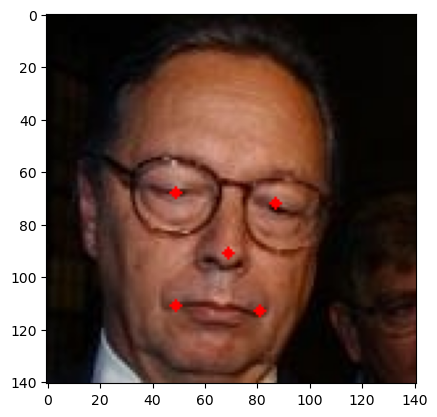

{'data_path': 'raw/80e96e6c-c90c-11ed-9720-a2d46b2f7ca3.jpg', 'box': [0.19117647058823528, 0.0, 0.8455882352941176, 1.0294117647058822], 'class': 1, 'is_have': 1, 'left_eye': [0.39705882352941174, 0.5073529411764706], 'right_eye': [0.6691176470588235, 0.4338235294117647], 'nose': [0.5808823529411765, 0.6397058823529411], 'mouth_left': [0.5073529411764706, 0.8235294117647058], 'mouth_right': [0.7058823529411765, 0.7794117647058824]}


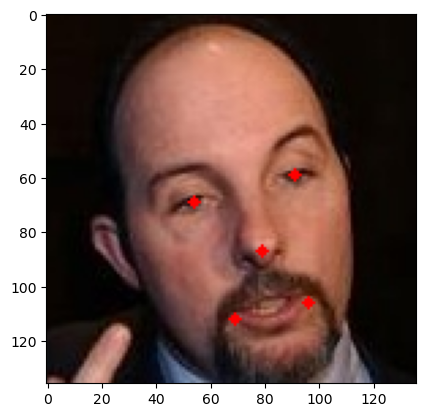

{'data_path': 'raw/80e96e6c-c90c-11ed-9720-a2d46b2f7ca3.jpg', 'box': [0.13768115942028986, -0.0072992700729927005, 0.7898550724637681, 0.9708029197080292], 'class': 1, 'is_have': 1, 'left_eye': [0.34782608695652173, 0.45985401459854014], 'right_eye': [0.6231884057971014, 0.48905109489051096], 'nose': [0.4927536231884058, 0.6277372262773723], 'mouth_left': [0.34782608695652173, 0.7737226277372263], 'mouth_right': [0.5797101449275363, 0.7956204379562044]}


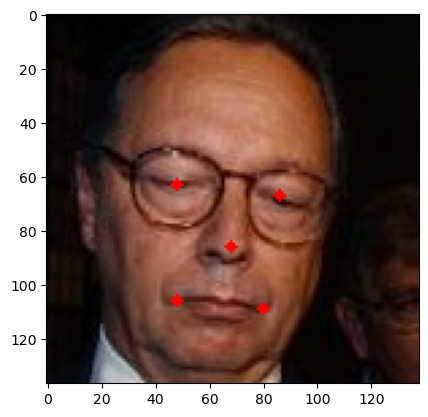

{'data_path': 'raw/80e96e6c-c90c-11ed-9720-a2d46b2f7ca3.jpg', 'box': [-0.03125, -0.15873015873015872, 0.828125, 1.1746031746031746], 'class': 1, 'is_have': 1, 'left_eye': [0.28125, 0.49206349206349204], 'right_eye': [0.609375, 0.4444444444444444], 'nose': [0.5, 0.6984126984126984], 'mouth_left': [0.375, 0.9047619047619048], 'mouth_right': [0.609375, 0.873015873015873]}


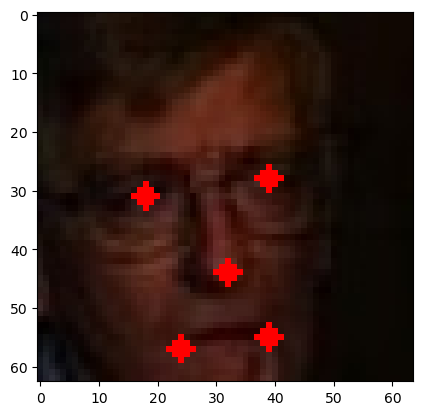

{'data_path': 'raw/80e96e6c-c90c-11ed-9720-a2d46b2f7ca3.jpg', 'box': [0.08955223880597014, -0.208955223880597, 0.9104477611940298, 1.044776119402985], 'class': 1, 'is_have': 1, 'left_eye': [0.3880597014925373, 0.40298507462686567], 'right_eye': [0.7014925373134329, 0.3582089552238806], 'nose': [0.5970149253731343, 0.5970149253731343], 'mouth_left': [0.47761194029850745, 0.7910447761194029], 'mouth_right': [0.7014925373134329, 0.7611940298507462]}


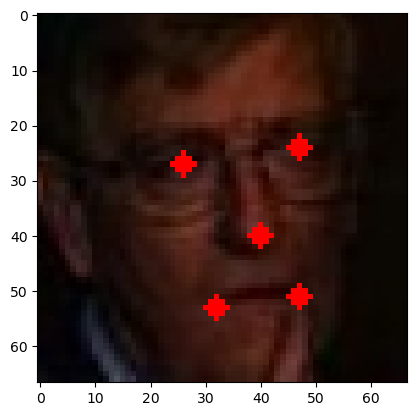

{'data_path': 'raw/80e96e6c-c90c-11ed-9720-a2d46b2f7ca3.jpg', 'box': [0.13043478260869565, -0.23478260869565218, 0.9130434782608695, 0.9304347826086956], 'class': 1, 'is_have': 1, 'left_eye': [0.3826086956521739, 0.3217391304347826], 'right_eye': [0.7130434782608696, 0.3565217391304348], 'nose': [0.5565217391304348, 0.5217391304347826], 'mouth_left': [0.3826086956521739, 0.6956521739130435], 'mouth_right': [0.6608695652173913, 0.7217391304347827]}


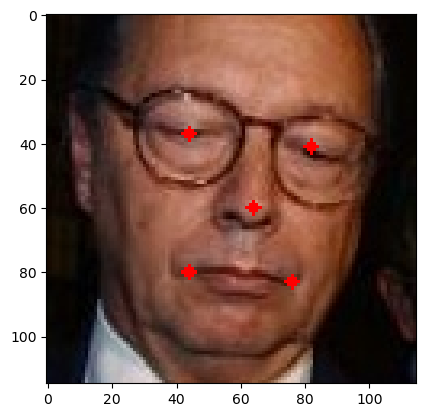

{'data_path': 'raw/80e96e6c-c90c-11ed-9720-a2d46b2f7ca3.jpg', 'box': [0.13385826771653545, -0.023622047244094488, 0.84251968503937, 1.031496062992126], 'class': 1, 'is_have': 1, 'left_eye': [0.36220472440944884, 0.48031496062992124], 'right_eye': [0.6614173228346457, 0.5118110236220472], 'nose': [0.5196850393700787, 0.6614173228346457], 'mouth_left': [0.36220472440944884, 0.8188976377952756], 'mouth_right': [0.6141732283464567, 0.84251968503937]}


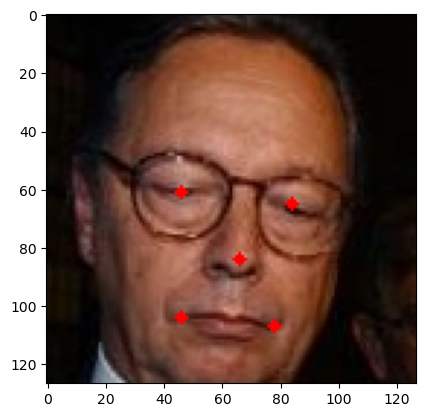

{'data_path': 'raw/80e96e6c-c90c-11ed-9720-a2d46b2f7ca3.jpg', 'box': [0.11538461538461539, 0.03076923076923077, 0.8076923076923077, 1.0615384615384615], 'class': 1, 'is_have': 1, 'left_eye': [0.3384615384615385, 0.5230769230769231], 'right_eye': [0.6307692307692307, 0.5538461538461539], 'nose': [0.49230769230769234, 0.7], 'mouth_left': [0.3384615384615385, 0.8538461538461538], 'mouth_right': [0.5846153846153846, 0.8769230769230769]}


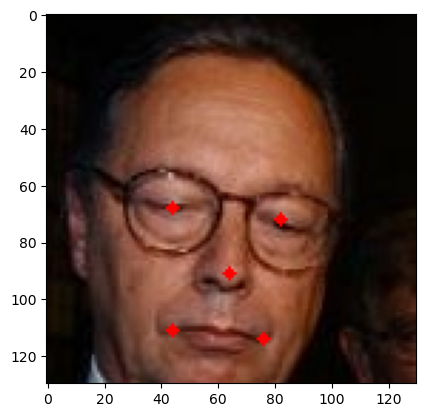

{'data_path': 'raw/80e96e6c-c90c-11ed-9720-a2d46b2f7ca3.jpg', 'box': [0.078125, -0.15384615384615385, 0.9375, 1.1384615384615384], 'class': 1, 'is_have': 1, 'left_eye': [0.390625, 0.47692307692307695], 'right_eye': [0.71875, 0.4307692307692308], 'nose': [0.609375, 0.676923076923077], 'mouth_left': [0.484375, 0.8769230769230769], 'mouth_right': [0.71875, 0.8461538461538461]}


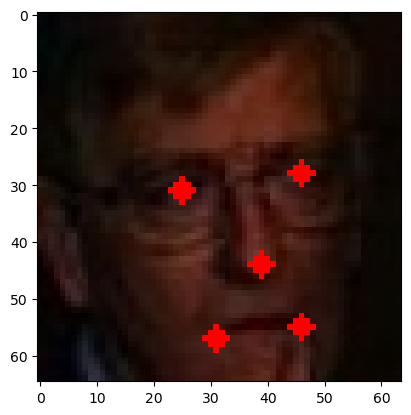

{'data_path': 'raw/80e96e6c-c90c-11ed-9720-a2d46b2f7ca3.jpg', 'box': [0.12698412698412698, -0.03937007874015748, 0.8412698412698413, 1.015748031496063], 'class': 1, 'is_have': 1, 'left_eye': [0.35714285714285715, 0.4645669291338583], 'right_eye': [0.6587301587301587, 0.49606299212598426], 'nose': [0.5158730158730159, 0.6456692913385826], 'mouth_left': [0.35714285714285715, 0.8031496062992126], 'mouth_right': [0.6111111111111112, 0.8267716535433071]}


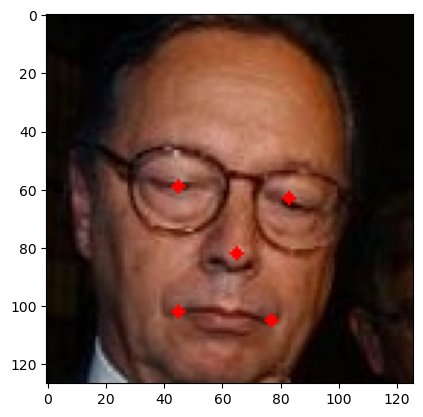

{'data_path': 'raw/80e9f742-c90c-11ed-9720-a2d46b2f7ca3.jpg', 'box': [0.2222222222222222, 0.049723756906077346, 0.8833333333333333, 1.011049723756906], 'class': 1, 'is_have': 1, 'left_eye': [0.3277777777777778, 0.4419889502762431], 'right_eye': [0.5444444444444444, 0.5082872928176796], 'nose': [0.3055555555555556, 0.6353591160220995], 'mouth_left': [0.2833333333333333, 0.7845303867403315], 'mouth_right': [0.45555555555555555, 0.8342541436464088]}


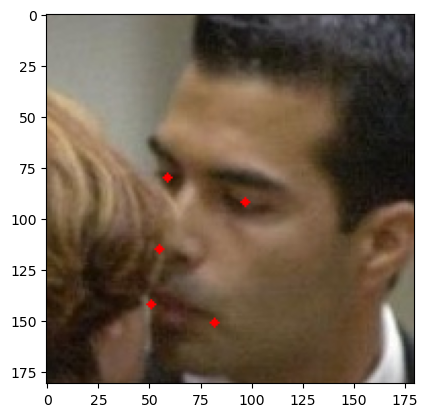

{'data_path': 'raw/80e9f742-c90c-11ed-9720-a2d46b2f7ca3.jpg', 'box': [0.13333333333333333, -0.1044776119402985, 1.0148148148148148, 1.1940298507462686], 'class': 1, 'is_have': 1, 'left_eye': [0.2740740740740741, 0.4253731343283582], 'right_eye': [0.562962962962963, 0.5149253731343284], 'nose': [0.24444444444444444, 0.6865671641791045], 'mouth_left': [0.21481481481481482, 0.8880597014925373], 'mouth_right': [0.4444444444444444, 0.9552238805970149]}


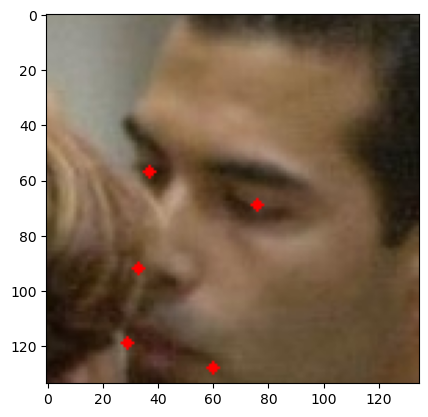

{'data_path': 'raw/80e9f742-c90c-11ed-9720-a2d46b2f7ca3.jpg', 'box': [0.18072289156626506, 0.03614457831325301, 0.8975903614457831, 1.0843373493975903], 'class': 1, 'is_have': 1, 'left_eye': [0.29518072289156627, 0.463855421686747], 'right_eye': [0.5301204819277109, 0.536144578313253], 'nose': [0.2710843373493976, 0.6746987951807228], 'mouth_left': [0.2469879518072289, 0.8373493975903614], 'mouth_right': [0.43373493975903615, 0.891566265060241]}


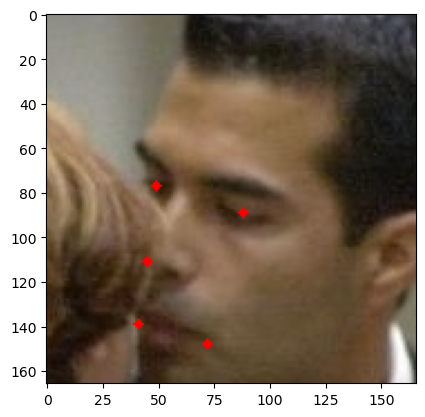

{'data_path': 'raw/80e9f742-c90c-11ed-9720-a2d46b2f7ca3.jpg', 'box': [0.09523809523809523, -0.1232876712328767, 0.9047619047619048, 1.0684931506849316], 'class': 1, 'is_have': 1, 'left_eye': [0.22448979591836735, 0.363013698630137], 'right_eye': [0.4897959183673469, 0.4452054794520548], 'nose': [0.19727891156462585, 0.6027397260273972], 'mouth_left': [0.17006802721088435, 0.7876712328767124], 'mouth_right': [0.38095238095238093, 0.8493150684931506]}


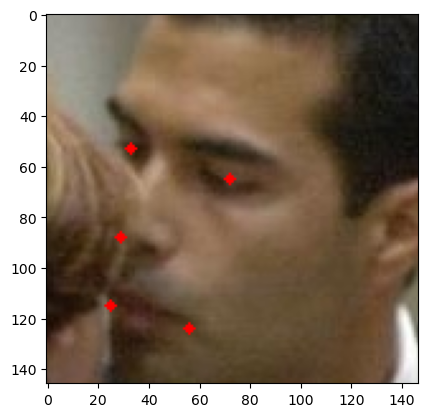

{'data_path': 'raw/80eaad2c-c90c-11ed-9720-a2d46b2f7ca3.jpg', 'box': [0.19047619047619047, 0.03773584905660377, 0.8761904761904762, 1.0660377358490567], 'class': 1, 'is_have': 1, 'left_eye': [0.38095238095238093, 0.5188679245283019], 'right_eye': [0.6761904761904762, 0.5660377358490566], 'nose': [0.5142857142857142, 0.7075471698113207], 'mouth_left': [0.3523809523809524, 0.8490566037735849], 'mouth_right': [0.6095238095238096, 0.8867924528301887]}


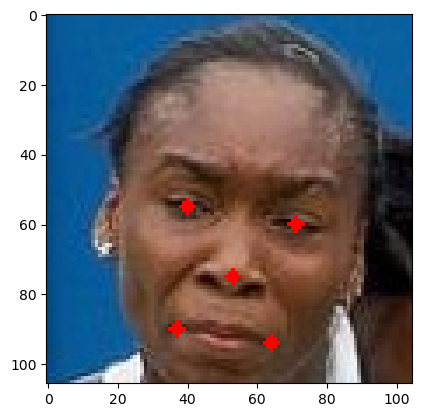

{'data_path': 'raw/80eaad2c-c90c-11ed-9720-a2d46b2f7ca3.jpg', 'box': [0.08108108108108109, -0.4266666666666667, 1.054054054054054, 1.0266666666666666], 'class': 1, 'is_have': 1, 'left_eye': [0.35135135135135137, 0.25333333333333335], 'right_eye': [0.7702702702702703, 0.32], 'nose': [0.5405405405405406, 0.52], 'mouth_left': [0.3108108108108108, 0.72], 'mouth_right': [0.6756756756756757, 0.7733333333333333]}


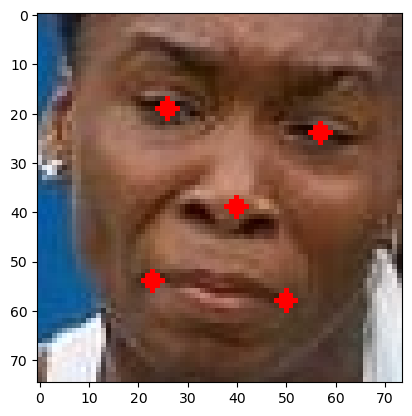

{'data_path': 'raw/80eaad2c-c90c-11ed-9720-a2d46b2f7ca3.jpg', 'box': [0.19387755102040816, -0.05102040816326531, 0.9285714285714286, 1.0612244897959184], 'class': 1, 'is_have': 1, 'left_eye': [0.3979591836734694, 0.46938775510204084], 'right_eye': [0.7142857142857143, 0.5204081632653061], 'nose': [0.5408163265306123, 0.673469387755102], 'mouth_left': [0.3673469387755102, 0.826530612244898], 'mouth_right': [0.6428571428571429, 0.8673469387755102]}


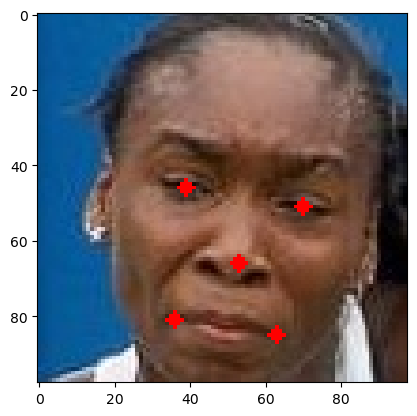

{'data_path': 'raw/80ebc1d0-c90c-11ed-9720-a2d46b2f7ca3.jpg', 'box': [0.17117117117117117, 0.009009009009009009, 0.8288288288288288, 1.0810810810810811], 'class': 1, 'is_have': 1, 'left_eye': [0.35135135135135137, 0.4774774774774775], 'right_eye': [0.6306306306306306, 0.4594594594594595], 'nose': [0.5045045045045045, 0.6126126126126126], 'mouth_left': [0.38738738738738737, 0.8018018018018018], 'mouth_right': [0.6306306306306306, 0.7837837837837838]}


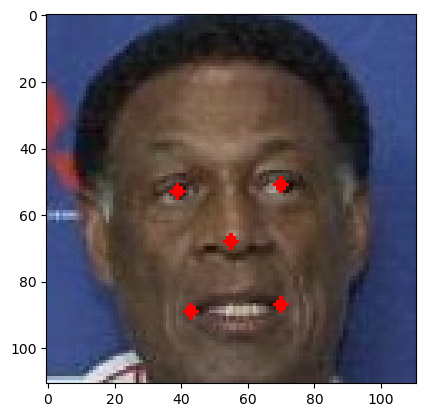

{'data_path': 'raw/80ebc1d0-c90c-11ed-9720-a2d46b2f7ca3.jpg', 'box': [0.20388349514563106, -0.009708737864077669, 0.912621359223301, 1.145631067961165], 'class': 1, 'is_have': 1, 'left_eye': [0.39805825242718446, 0.49514563106796117], 'right_eye': [0.6990291262135923, 0.47572815533980584], 'nose': [0.5631067961165048, 0.6407766990291263], 'mouth_left': [0.4368932038834951, 0.8446601941747572], 'mouth_right': [0.6990291262135923, 0.8252427184466019]}


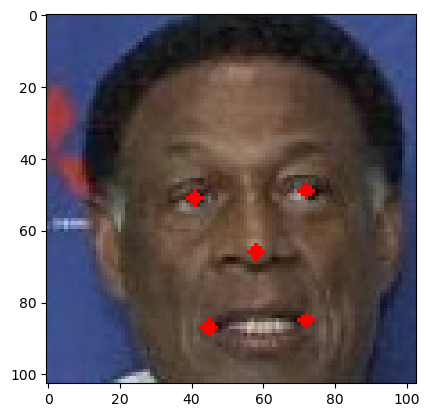

{'data_path': 'raw/80ebc1d0-c90c-11ed-9720-a2d46b2f7ca3.jpg', 'box': [0.09302325581395349, -0.11764705882352941, 0.8604651162790697, 1.1764705882352942], 'class': 1, 'is_have': 1, 'left_eye': [0.313953488372093, 0.4], 'right_eye': [0.6627906976744186, 0.4117647058823529], 'nose': [0.5, 0.6], 'mouth_left': [0.313953488372093, 0.8], 'mouth_right': [0.6511627906976745, 0.8]}


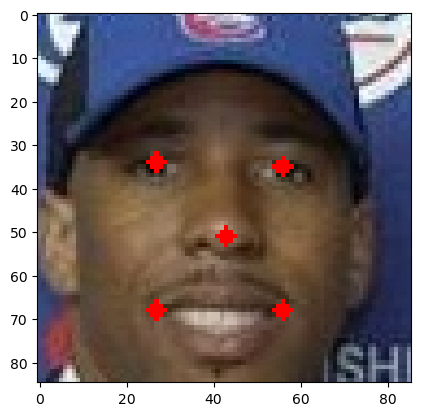

{'data_path': 'raw/80ebc1d0-c90c-11ed-9720-a2d46b2f7ca3.jpg', 'box': [0.2127659574468085, -0.2127659574468085, 0.9893617021276596, 1.053191489361702], 'class': 1, 'is_have': 1, 'left_eye': [0.425531914893617, 0.3404255319148936], 'right_eye': [0.7553191489361702, 0.3191489361702128], 'nose': [0.6063829787234043, 0.5], 'mouth_left': [0.46808510638297873, 0.723404255319149], 'mouth_right': [0.7553191489361702, 0.7021276595744681]}


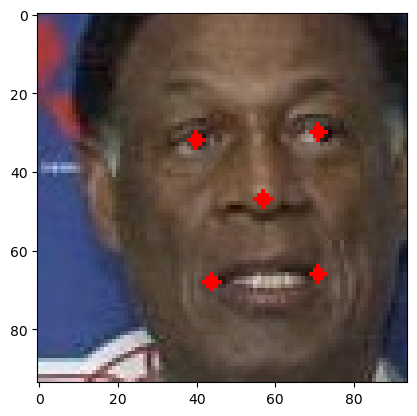

{'data_path': 'raw/80ebc1d0-c90c-11ed-9720-a2d46b2f7ca3.jpg', 'box': [0.10638297872340426, -0.06451612903225806, 0.8085106382978723, 1.118279569892473], 'class': 1, 'is_have': 1, 'left_eye': [0.30851063829787234, 0.40860215053763443], 'right_eye': [0.6276595744680851, 0.41935483870967744], 'nose': [0.4787234042553192, 0.5913978494623656], 'mouth_left': [0.30851063829787234, 0.7741935483870968], 'mouth_right': [0.6170212765957447, 0.7741935483870968]}


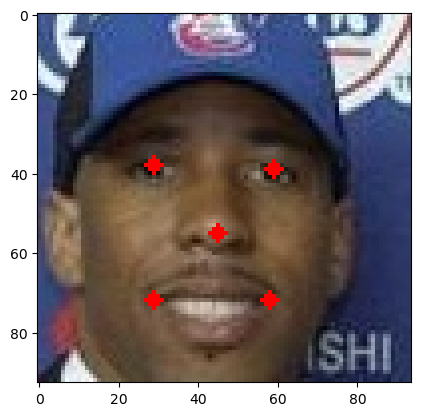

{'data_path': 'raw/80ebc1d0-c90c-11ed-9720-a2d46b2f7ca3.jpg', 'box': [0.12871287128712872, 0.02, 0.7821782178217822, 1.12], 'class': 1, 'is_have': 1, 'left_eye': [0.31683168316831684, 0.46], 'right_eye': [0.6138613861386139, 0.47], 'nose': [0.4752475247524752, 0.63], 'mouth_left': [0.31683168316831684, 0.8], 'mouth_right': [0.6039603960396039, 0.8]}


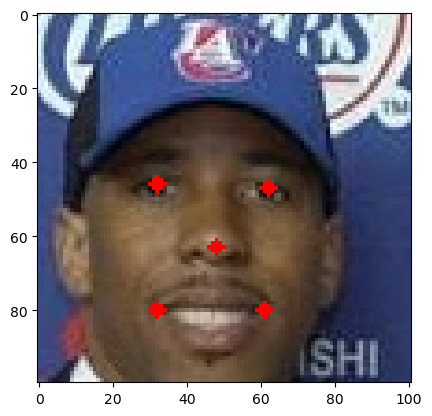

{'data_path': 'raw/80ebc1d0-c90c-11ed-9720-a2d46b2f7ca3.jpg', 'box': [0.16494845360824742, -0.020618556701030927, 0.845360824742268, 1.1134020618556701], 'class': 1, 'is_have': 1, 'left_eye': [0.36082474226804123, 0.4329896907216495], 'right_eye': [0.6701030927835051, 0.44329896907216493], 'nose': [0.5257731958762887, 0.6082474226804123], 'mouth_left': [0.36082474226804123, 0.7835051546391752], 'mouth_right': [0.6597938144329897, 0.7835051546391752]}


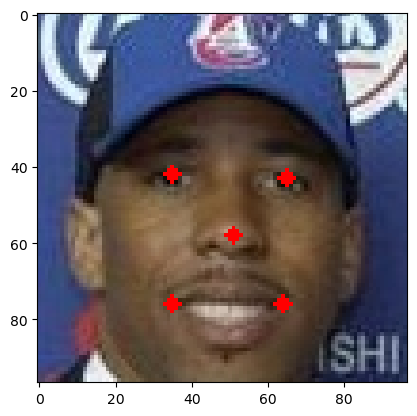

{'data_path': 'raw/80ebc1d0-c90c-11ed-9720-a2d46b2f7ca3.jpg', 'box': [0.11538461538461539, -0.019230769230769232, 0.8173076923076923, 1.125], 'class': 1, 'is_have': 1, 'left_eye': [0.3076923076923077, 0.4807692307692308], 'right_eye': [0.6057692307692307, 0.46153846153846156], 'nose': [0.47115384615384615, 0.625], 'mouth_left': [0.34615384615384615, 0.8269230769230769], 'mouth_right': [0.6057692307692307, 0.8076923076923077]}


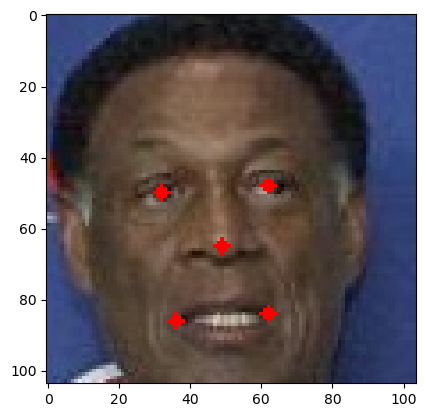

{'data_path': 'raw/80ebc1d0-c90c-11ed-9720-a2d46b2f7ca3.jpg', 'box': [0.24705882352941178, -0.058823529411764705, 1.0235294117647058, 1.2352941176470589], 'class': 1, 'is_have': 1, 'left_eye': [0.47058823529411764, 0.4588235294117647], 'right_eye': [0.8235294117647058, 0.47058823529411764], 'nose': [0.6588235294117647, 0.6588235294117647], 'mouth_left': [0.47058823529411764, 0.8588235294117647], 'mouth_right': [0.8117647058823529, 0.8588235294117647]}


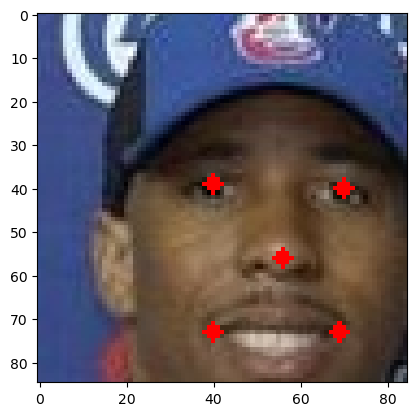

{'data_path': 'raw/80ecbb6c-c90c-11ed-9720-a2d46b2f7ca3.jpg', 'box': [0.1, -0.02564102564102564, 0.8611111111111112, 1.0], 'class': 1, 'is_have': 1, 'left_eye': [0.4111111111111111, 0.48717948717948717], 'right_eye': [0.6666666666666666, 0.5538461538461539], 'nose': [0.5388888888888889, 0.6871794871794872], 'mouth_left': [0.34444444444444444, 0.7384615384615385], 'mouth_right': [0.5611111111111111, 0.8]}


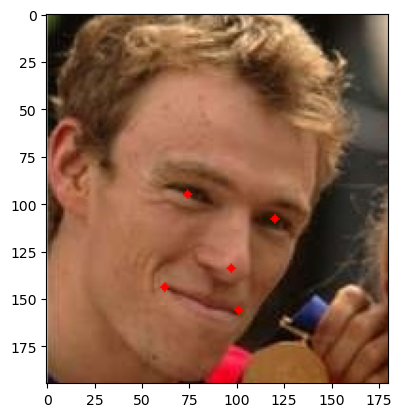

{'data_path': 'raw/80ecbb6c-c90c-11ed-9720-a2d46b2f7ca3.jpg', 'box': [0.1, -0.06153846153846154, 0.8611111111111112, 0.9641025641025641], 'class': 1, 'is_have': 1, 'left_eye': [0.4111111111111111, 0.4512820512820513], 'right_eye': [0.6666666666666666, 0.517948717948718], 'nose': [0.5388888888888889, 0.6512820512820513], 'mouth_left': [0.34444444444444444, 0.7025641025641025], 'mouth_right': [0.5611111111111111, 0.764102564102564]}


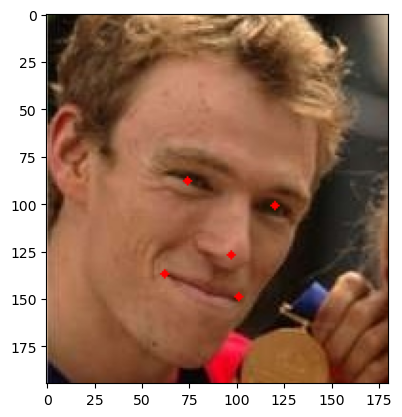

{'data_path': 'raw/80ecbb6c-c90c-11ed-9720-a2d46b2f7ca3.jpg', 'box': [0.22, -0.13333333333333333, 0.9133333333333333, 1.0533333333333332], 'class': 1, 'is_have': 1, 'left_eye': [0.4066666666666667, 0.43333333333333335], 'right_eye': [0.72, 0.44], 'nose': [0.5733333333333334, 0.6266666666666667], 'mouth_left': [0.4, 0.7466666666666667], 'mouth_right': [0.72, 0.7533333333333333]}


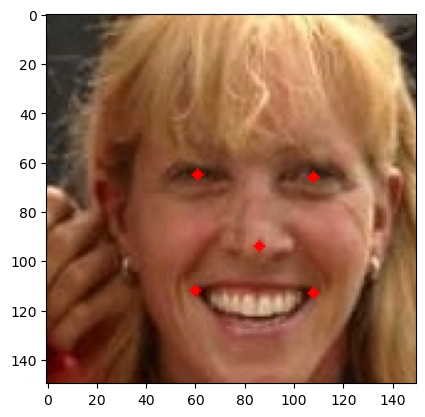

{'data_path': 'raw/80ed1512-c90c-11ed-9720-a2d46b2f7ca3.jpg', 'box': [0.17475728155339806, 0.00975609756097561, 0.8543689320388349, 1.0146341463414634], 'class': 1, 'is_have': 1, 'left_eye': [0.3786407766990291, 0.4585365853658537], 'right_eye': [0.6650485436893204, 0.4634146341463415], 'nose': [0.5388349514563107, 0.624390243902439], 'mouth_left': [0.4029126213592233, 0.7707317073170732], 'mouth_right': [0.6407766990291263, 0.775609756097561]}


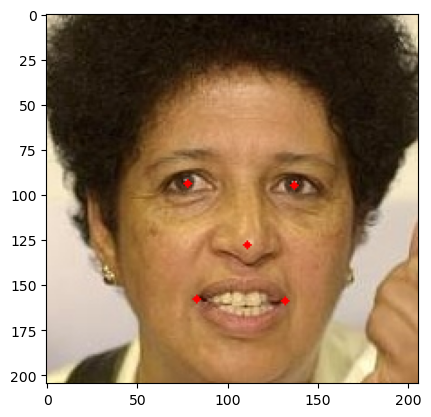

{'data_path': 'raw/80ed1512-c90c-11ed-9720-a2d46b2f7ca3.jpg', 'box': [0.135, -0.06, 0.835, 0.97], 'class': 1, 'is_have': 1, 'left_eye': [0.345, 0.4], 'right_eye': [0.64, 0.405], 'nose': [0.51, 0.57], 'mouth_left': [0.37, 0.72], 'mouth_right': [0.615, 0.725]}


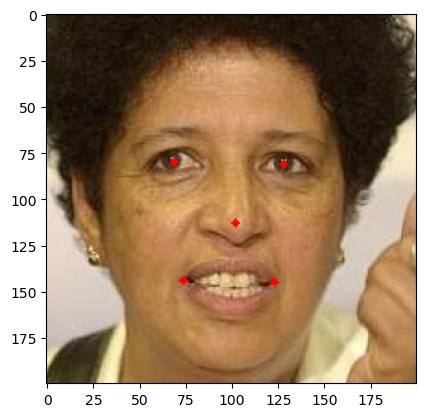

{'data_path': 'raw/80ed1512-c90c-11ed-9720-a2d46b2f7ca3.jpg', 'box': [0.12834224598930483, 0.0106951871657754, 0.8770053475935828, 1.1122994652406417], 'class': 1, 'is_have': 1, 'left_eye': [0.35294117647058826, 0.5026737967914439], 'right_eye': [0.6684491978609626, 0.5080213903743316], 'nose': [0.5294117647058824, 0.6844919786096256], 'mouth_left': [0.37967914438502676, 0.8449197860962567], 'mouth_right': [0.6417112299465241, 0.8502673796791443]}


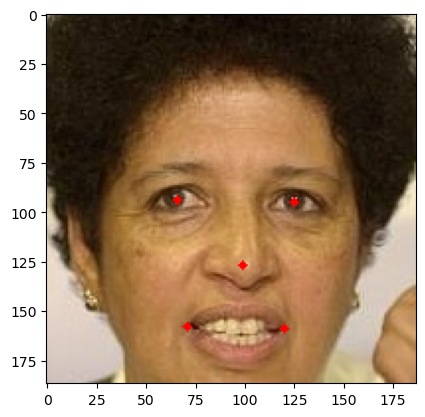

{'data_path': 'raw/80ed1512-c90c-11ed-9720-a2d46b2f7ca3.jpg', 'box': [0.045454545454545456, -0.04, 0.8409090909090909, 1.1371428571428572], 'class': 1, 'is_have': 1, 'left_eye': [0.2840909090909091, 0.4857142857142857], 'right_eye': [0.6193181818181818, 0.49142857142857144], 'nose': [0.4715909090909091, 0.68], 'mouth_left': [0.3125, 0.8514285714285714], 'mouth_right': [0.5909090909090909, 0.8571428571428571]}


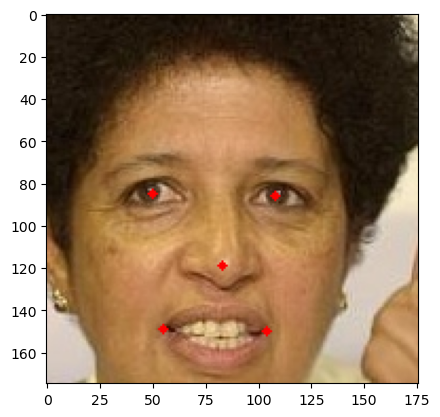

{'data_path': 'raw/80edbeea-c90c-11ed-9720-a2d46b2f7ca3.jpg', 'box': [0.17993079584775087, 0.006920415224913495, 0.8442906574394463, 1.013840830449827], 'class': 1, 'is_have': 1, 'left_eye': [0.370242214532872, 0.4809688581314879], 'right_eye': [0.657439446366782, 0.5017301038062284], 'nose': [0.5190311418685121, 0.6228373702422145], 'mouth_left': [0.3806228373702422, 0.7958477508650519], 'mouth_right': [0.6193771626297578, 0.8096885813148789]}


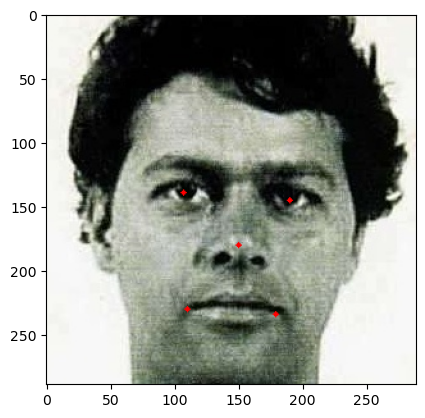

{'data_path': 'raw/80edbeea-c90c-11ed-9720-a2d46b2f7ca3.jpg', 'box': [0.11494252873563218, -0.05343511450381679, 0.8505747126436781, 1.0572519083969465], 'class': 1, 'is_have': 1, 'left_eye': [0.32567049808429116, 0.46946564885496184], 'right_eye': [0.6436781609195402, 0.49236641221374045], 'nose': [0.4904214559386973, 0.6259541984732825], 'mouth_left': [0.3371647509578544, 0.816793893129771], 'mouth_right': [0.6015325670498084, 0.8320610687022901]}


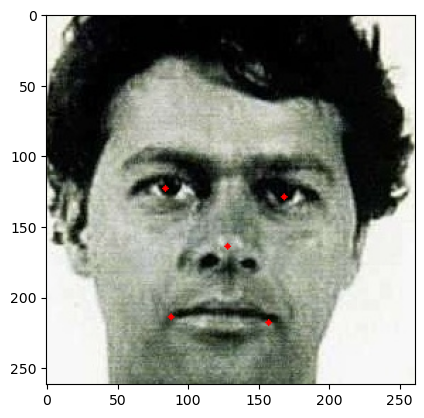

{'data_path': 'raw/80edbeea-c90c-11ed-9720-a2d46b2f7ca3.jpg', 'box': [0.10833333333333334, -0.11297071129707113, 0.9083333333333333, 1.104602510460251], 'class': 1, 'is_have': 1, 'left_eye': [0.3375, 0.4602510460251046], 'right_eye': [0.6833333333333333, 0.48535564853556484], 'nose': [0.5166666666666667, 0.6317991631799164], 'mouth_left': [0.35, 0.8410041841004184], 'mouth_right': [0.6375, 0.8577405857740585]}


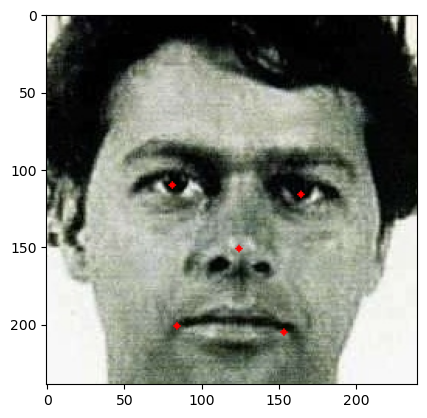

{'data_path': 'raw/80ee1fb6-c90c-11ed-9720-a2d46b2f7ca3.jpg', 'box': [0.06741573033707865, 0.045454545454545456, 1.0786516853932584, 1.1818181818181819], 'class': 1, 'is_have': 1, 'left_eye': [0.24719101123595505, 0.5727272727272728], 'right_eye': [0.5955056179775281, 0.5454545454545454], 'nose': [0.29213483146067415, 0.7181818181818181], 'mouth_left': [0.25842696629213485, 0.9272727272727272], 'mouth_right': [0.550561797752809, 0.9]}


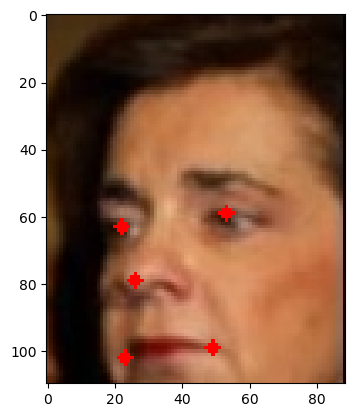

{'data_path': 'raw/80ee1fb6-c90c-11ed-9720-a2d46b2f7ca3.jpg', 'box': [0.09782608695652174, 0.05555555555555555, 1.076086956521739, 1.212962962962963], 'class': 1, 'is_have': 1, 'left_eye': [0.2717391304347826, 0.5925925925925926], 'right_eye': [0.6086956521739131, 0.5648148148148148], 'nose': [0.31521739130434784, 0.7407407407407407], 'mouth_left': [0.2826086956521739, 0.9537037037037037], 'mouth_right': [0.5652173913043478, 0.9259259259259259]}


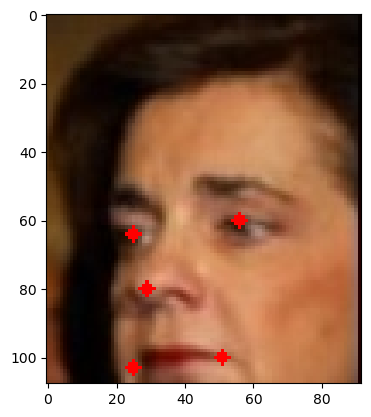

{'data_path': 'raw/80ee1fb6-c90c-11ed-9720-a2d46b2f7ca3.jpg', 'box': [0.10752688172043011, -0.009009009009009009, 1.075268817204301, 1.117117117117117], 'class': 1, 'is_have': 1, 'left_eye': [0.27956989247311825, 0.5135135135135135], 'right_eye': [0.6129032258064516, 0.4864864864864865], 'nose': [0.3225806451612903, 0.6576576576576577], 'mouth_left': [0.2903225806451613, 0.8648648648648649], 'mouth_right': [0.5698924731182796, 0.8378378378378378]}


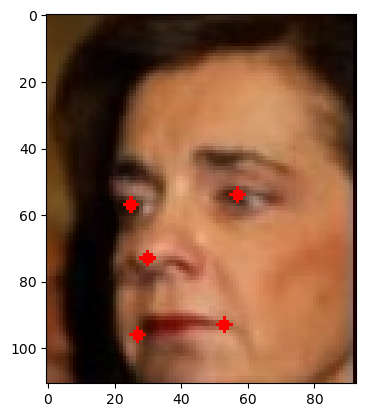

{'data_path': 'raw/80ee1fb6-c90c-11ed-9720-a2d46b2f7ca3.jpg', 'box': [0.16265060240963855, 0.029940119760479042, 0.8614457831325302, 1.0], 'class': 1, 'is_have': 1, 'left_eye': [0.3373493975903614, 0.46107784431137727], 'right_eye': [0.6265060240963856, 0.41317365269461076], 'nose': [0.5, 0.6167664670658682], 'mouth_left': [0.39759036144578314, 0.7844311377245509], 'mouth_right': [0.6506024096385542, 0.7485029940119761]}


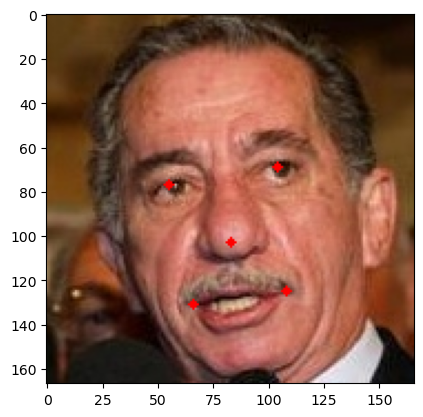

{'data_path': 'raw/80ee1fb6-c90c-11ed-9720-a2d46b2f7ca3.jpg', 'box': [0.07051282051282051, 0.07051282051282051, 0.8141025641025641, 1.108974358974359], 'class': 1, 'is_have': 1, 'left_eye': [0.2564102564102564, 0.532051282051282], 'right_eye': [0.5641025641025641, 0.4807692307692308], 'nose': [0.42948717948717946, 0.6987179487179487], 'mouth_left': [0.32051282051282054, 0.8782051282051282], 'mouth_right': [0.5897435897435898, 0.8397435897435898]}


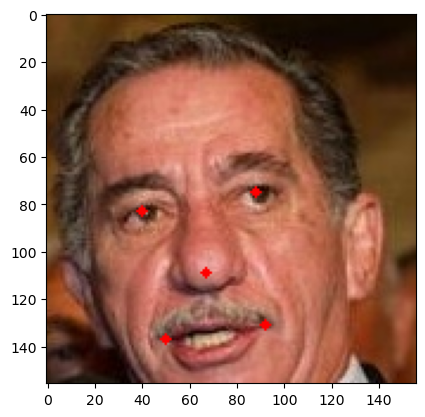

{'data_path': 'raw/80ee1fb6-c90c-11ed-9720-a2d46b2f7ca3.jpg', 'box': [-0.03225806451612903, -0.3225806451612903, 0.9032258064516129, 1.0161290322580645], 'class': 1, 'is_have': 0, 'left_eye': [0, 0], 'right_eye': [0, 0], 'nose': [0, 0], 'mouth_left': [0, 0], 'mouth_right': [0, 0]}


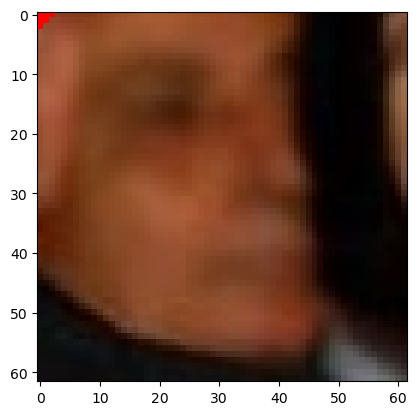

{'data_path': 'raw/80ee1fb6-c90c-11ed-9720-a2d46b2f7ca3.jpg', 'box': [0.1782178217821782, 0.08333333333333333, 1.0693069306930694, 1.2407407407407407], 'class': 1, 'is_have': 1, 'left_eye': [0.33663366336633666, 0.6203703703703703], 'right_eye': [0.6435643564356436, 0.5925925925925926], 'nose': [0.37623762376237624, 0.7685185185185185], 'mouth_left': [0.3465346534653465, 0.9814814814814815], 'mouth_right': [0.6039603960396039, 0.9537037037037037]}


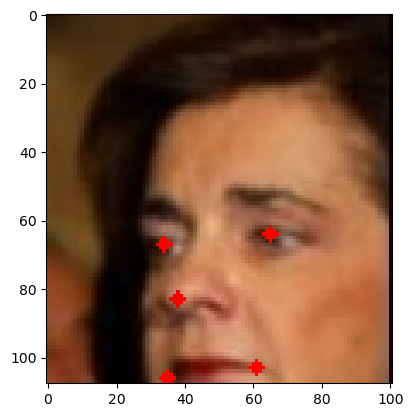

{'data_path': 'raw/80ee1fb6-c90c-11ed-9720-a2d46b2f7ca3.jpg', 'box': [0.03508771929824561, -0.45614035087719296, 1.0526315789473684, 1.0], 'class': 1, 'is_have': 0, 'left_eye': [0, 0], 'right_eye': [0, 0], 'nose': [0, 0], 'mouth_left': [0, 0], 'mouth_right': [0, 0]}


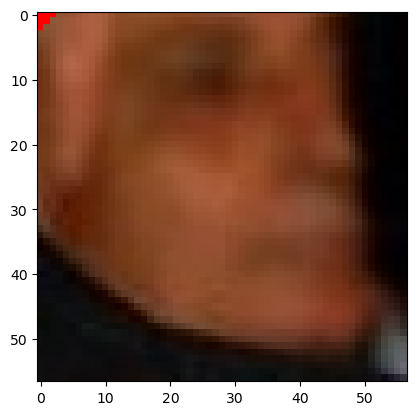

{'data_path': 'raw/80ee1fb6-c90c-11ed-9720-a2d46b2f7ca3.jpg', 'box': [0.15294117647058825, 0.029411764705882353, 0.8352941176470589, 0.9823529411764705], 'class': 1, 'is_have': 1, 'left_eye': [0.3235294117647059, 0.45294117647058824], 'right_eye': [0.6058823529411764, 0.40588235294117647], 'nose': [0.4823529411764706, 0.6058823529411764], 'mouth_left': [0.38235294117647056, 0.7705882352941177], 'mouth_right': [0.6294117647058823, 0.7352941176470589]}


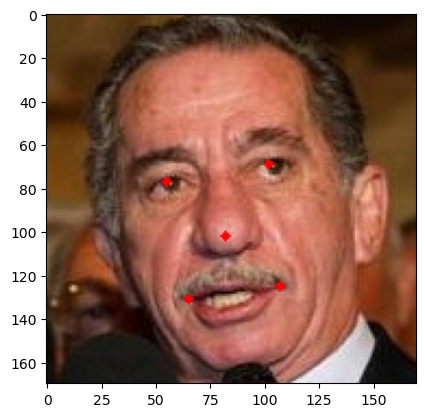

{'data_path': 'raw/80ee1fb6-c90c-11ed-9720-a2d46b2f7ca3.jpg', 'box': [-0.015625, -0.15625, 0.890625, 1.140625], 'class': 1, 'is_have': 0, 'left_eye': [0, 0], 'right_eye': [0, 0], 'nose': [0, 0], 'mouth_left': [0, 0], 'mouth_right': [0, 0]}


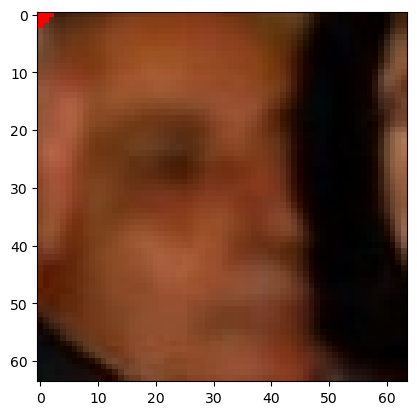

{'data_path': 'raw/80ee1fb6-c90c-11ed-9720-a2d46b2f7ca3.jpg', 'box': [0.15306122448979592, 0.058333333333333334, 1.0714285714285714, 1.1], 'class': 1, 'is_have': 1, 'left_eye': [0.3163265306122449, 0.5416666666666666], 'right_eye': [0.6326530612244898, 0.5166666666666667], 'nose': [0.35714285714285715, 0.675], 'mouth_left': [0.32653061224489793, 0.8666666666666667], 'mouth_right': [0.5918367346938775, 0.8416666666666667]}


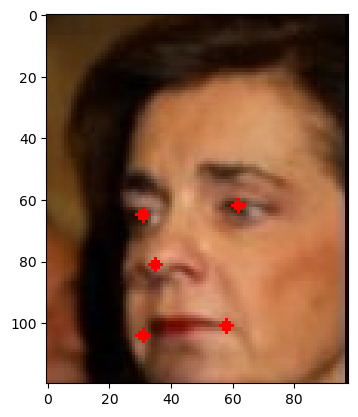

{'data_path': 'raw/80ee7b28-c90c-11ed-9720-a2d46b2f7ca3.jpg', 'box': [0.22424242424242424, -0.030303030303030304, 0.8909090909090909, 0.9696969696969697], 'class': 1, 'is_have': 1, 'left_eye': [0.38181818181818183, 0.46060606060606063], 'right_eye': [0.6545454545454545, 0.4727272727272727], 'nose': [0.503030303030303, 0.6242424242424243], 'mouth_left': [0.3939393939393939, 0.7757575757575758], 'mouth_right': [0.6181818181818182, 0.7757575757575758]}


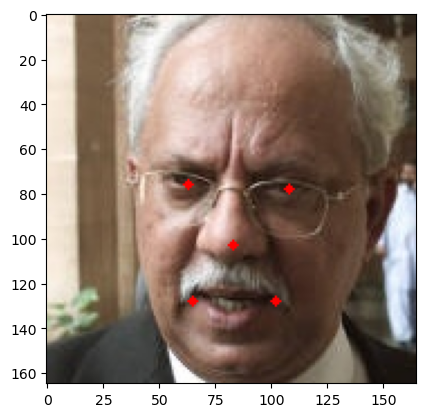

{'data_path': 'raw/80ee7b28-c90c-11ed-9720-a2d46b2f7ca3.jpg', 'box': [0.15384615384615385, 0.15384615384615385, 0.9615384615384616, 1.2307692307692308], 'class': 1, 'is_have': 0, 'left_eye': [0, 0], 'right_eye': [0, 0], 'nose': [0, 0], 'mouth_left': [0, 0], 'mouth_right': [0, 0]}


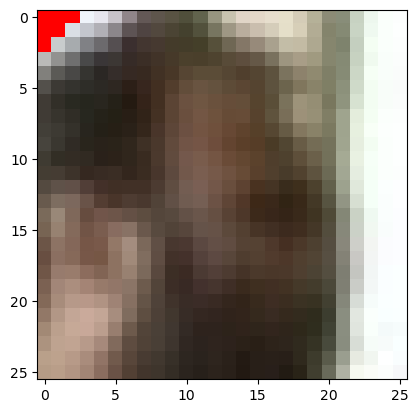

{'data_path': 'raw/80ee7b28-c90c-11ed-9720-a2d46b2f7ca3.jpg', 'box': [0.19594594594594594, -0.10738255033557047, 0.9391891891891891, 1.0], 'class': 1, 'is_have': 1, 'left_eye': [0.3716216216216216, 0.436241610738255], 'right_eye': [0.6756756756756757, 0.44966442953020136], 'nose': [0.5067567567567568, 0.6174496644295302], 'mouth_left': [0.38513513513513514, 0.785234899328859], 'mouth_right': [0.6351351351351351, 0.785234899328859]}


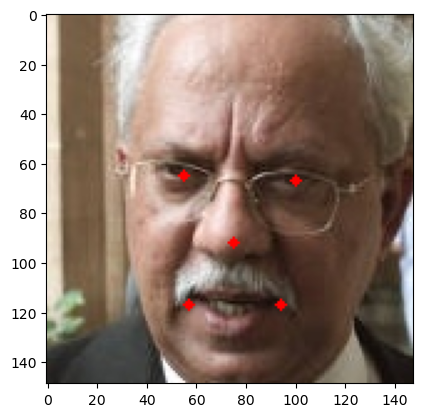

{'data_path': 'raw/80ee7b28-c90c-11ed-9720-a2d46b2f7ca3.jpg', 'box': [0.15862068965517243, -0.08333333333333333, 0.9172413793103448, 1.0625], 'class': 1, 'is_have': 1, 'left_eye': [0.33793103448275863, 0.4791666666666667], 'right_eye': [0.6482758620689655, 0.4930555555555556], 'nose': [0.47586206896551725, 0.6666666666666666], 'mouth_left': [0.35172413793103446, 0.8402777777777778], 'mouth_right': [0.6068965517241379, 0.8402777777777778]}


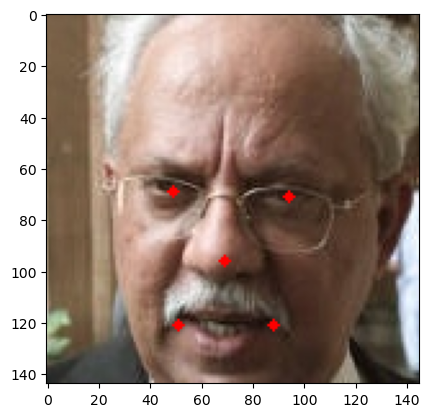

{'data_path': 'raw/80ee7b28-c90c-11ed-9720-a2d46b2f7ca3.jpg', 'box': [0.25165562913907286, -0.125, 0.9801324503311258, 0.9605263157894737], 'class': 1, 'is_have': 1, 'left_eye': [0.423841059602649, 0.40789473684210525], 'right_eye': [0.7218543046357616, 0.42105263157894735], 'nose': [0.5562913907284768, 0.5855263157894737], 'mouth_left': [0.4370860927152318, 0.75], 'mouth_right': [0.6821192052980133, 0.75]}


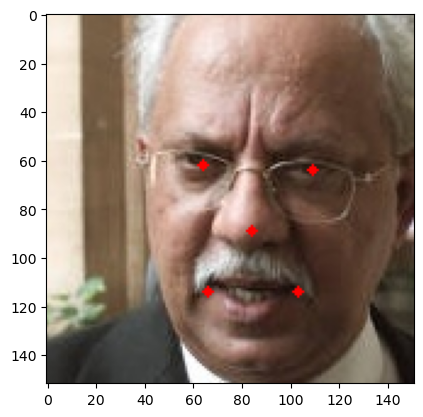

{'data_path': 'raw/80ef472e-c90c-11ed-9720-a2d46b2f7ca3.jpg', 'box': [0.15204678362573099, -0.07058823529411765, 0.8596491228070176, 1.0294117647058822], 'class': 1, 'is_have': 1, 'left_eye': [0.3333333333333333, 0.49411764705882355], 'right_eye': [0.5964912280701754, 0.48823529411764705], 'nose': [0.4444444444444444, 0.6647058823529411], 'mouth_left': [0.36257309941520466, 0.788235294117647], 'mouth_right': [0.5730994152046783, 0.788235294117647]}


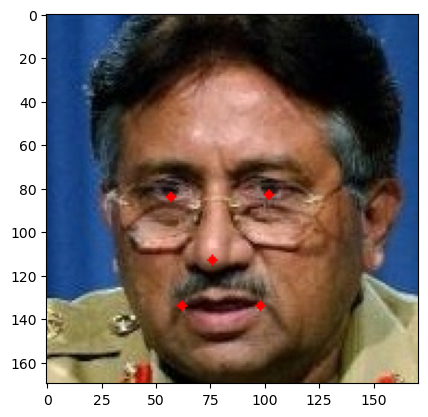

{'data_path': 'raw/80ef472e-c90c-11ed-9720-a2d46b2f7ca3.jpg', 'box': [0.1958041958041958, -0.19014084507042253, 1.0419580419580419, 1.1267605633802817], 'class': 1, 'is_have': 1, 'left_eye': [0.4125874125874126, 0.4859154929577465], 'right_eye': [0.7272727272727273, 0.4788732394366197], 'nose': [0.5454545454545454, 0.6901408450704225], 'mouth_left': [0.44755244755244755, 0.8380281690140845], 'mouth_right': [0.6993006993006993, 0.8380281690140845]}


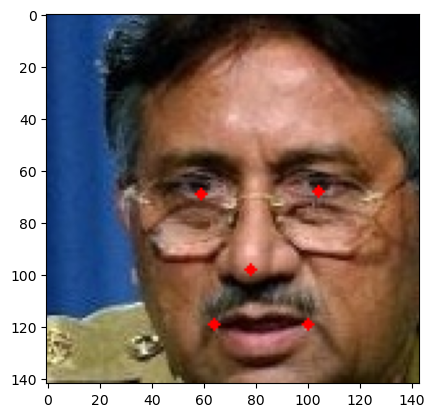

{'data_path': 'raw/80ef472e-c90c-11ed-9720-a2d46b2f7ca3.jpg', 'box': [0.0, -0.16793893129770993, 0.9307692307692308, 1.2595419847328244], 'class': 1, 'is_have': 1, 'left_eye': [0.23846153846153847, 0.5648854961832062], 'right_eye': [0.5846153846153846, 0.5572519083969466], 'nose': [0.38461538461538464, 0.7862595419847328], 'mouth_left': [0.27692307692307694, 0.9465648854961832], 'mouth_right': [0.5538461538461539, 0.9465648854961832]}


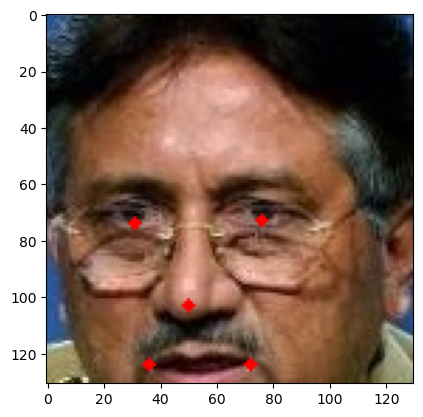

{'data_path': 'raw/80ef472e-c90c-11ed-9720-a2d46b2f7ca3.jpg', 'box': [0.08974358974358974, -0.22435897435897437, 0.8653846153846154, 0.9743589743589743], 'class': 1, 'is_have': 1, 'left_eye': [0.28846153846153844, 0.391025641025641], 'right_eye': [0.5769230769230769, 0.38461538461538464], 'nose': [0.41025641025641024, 0.5769230769230769], 'mouth_left': [0.32051282051282054, 0.7115384615384616], 'mouth_right': [0.5512820512820513, 0.7115384615384616]}


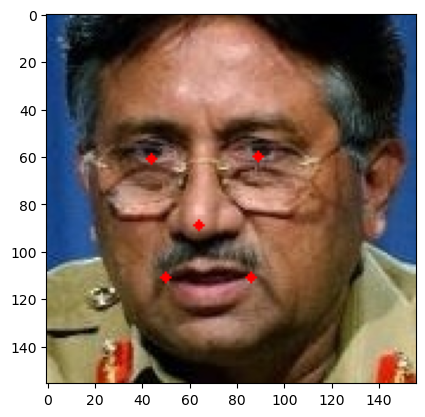

{'data_path': 'raw/80ef472e-c90c-11ed-9720-a2d46b2f7ca3.jpg', 'box': [0.12941176470588237, -0.06470588235294118, 0.8411764705882353, 1.035294117647059], 'class': 1, 'is_have': 1, 'left_eye': [0.31176470588235294, 0.5], 'right_eye': [0.5764705882352941, 0.49411764705882355], 'nose': [0.4235294117647059, 0.6705882352941176], 'mouth_left': [0.3411764705882353, 0.7941176470588235], 'mouth_right': [0.5529411764705883, 0.7941176470588235]}


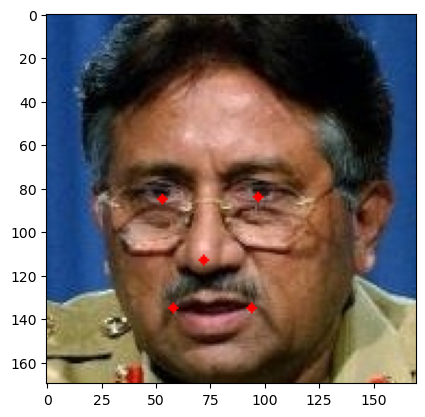

{'data_path': 'raw/80ef472e-c90c-11ed-9720-a2d46b2f7ca3.jpg', 'box': [0.16842105263157894, 0.042105263157894736, 0.8052631578947368, 1.0263157894736843], 'class': 1, 'is_have': 1, 'left_eye': [0.33157894736842103, 0.5473684210526316], 'right_eye': [0.5684210526315789, 0.5421052631578948], 'nose': [0.43157894736842106, 0.7], 'mouth_left': [0.35789473684210527, 0.8105263157894737], 'mouth_right': [0.5473684210526316, 0.8105263157894737]}


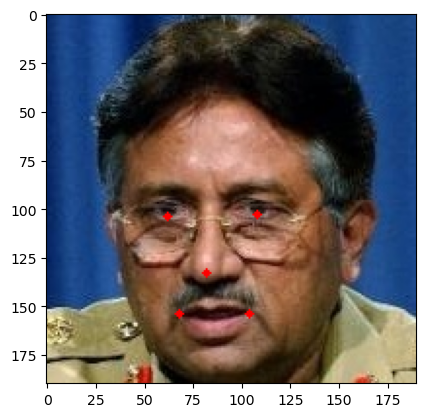

{'data_path': 'raw/80ef472e-c90c-11ed-9720-a2d46b2f7ca3.jpg', 'box': [0.0859375, -0.36220472440944884, 1.03125, 1.110236220472441], 'class': 1, 'is_have': 1, 'left_eye': [0.328125, 0.3937007874015748], 'right_eye': [0.6796875, 0.3858267716535433], 'nose': [0.4765625, 0.6220472440944882], 'mouth_left': [0.3671875, 0.7874015748031497], 'mouth_right': [0.6484375, 0.7874015748031497]}


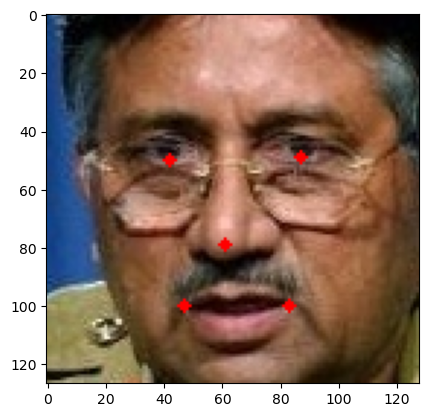

{'data_path': 'raw/80ef472e-c90c-11ed-9720-a2d46b2f7ca3.jpg', 'box': [0.11920529801324503, -0.11920529801324503, 0.9205298013245033, 1.119205298013245], 'class': 1, 'is_have': 1, 'left_eye': [0.32450331125827814, 0.5165562913907285], 'right_eye': [0.6225165562913907, 0.5099337748344371], 'nose': [0.4503311258278146, 0.7086092715231788], 'mouth_left': [0.3576158940397351, 0.847682119205298], 'mouth_right': [0.5960264900662252, 0.847682119205298]}


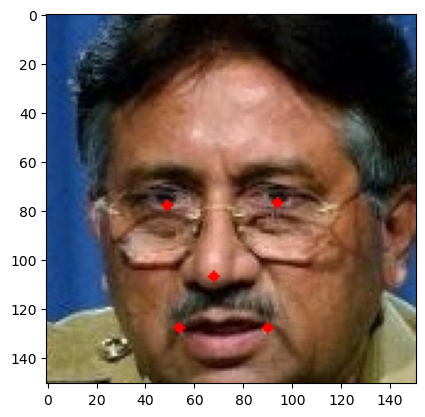

{'data_path': 'raw/80ef472e-c90c-11ed-9720-a2d46b2f7ca3.jpg', 'box': [0.019736842105263157, -0.12418300653594772, 0.8157894736842105, 1.0980392156862746], 'class': 1, 'is_have': 1, 'left_eye': [0.2236842105263158, 0.5032679738562091], 'right_eye': [0.5197368421052632, 0.49673202614379086], 'nose': [0.34868421052631576, 0.6928104575163399], 'mouth_left': [0.2565789473684211, 0.8300653594771242], 'mouth_right': [0.4934210526315789, 0.8300653594771242]}


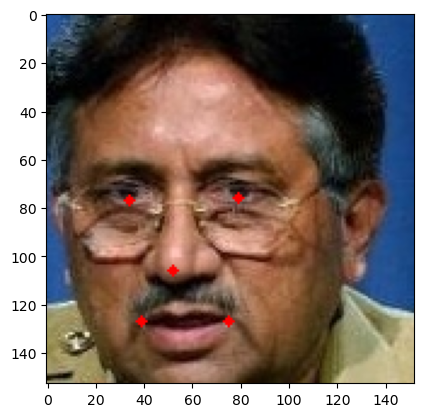

{'data_path': 'raw/80efbf60-c90c-11ed-9720-a2d46b2f7ca3.jpg', 'box': [0.19827586206896552, -0.04310344827586207, 0.9137931034482759, 1.0172413793103448], 'class': 1, 'is_have': 1, 'left_eye': [0.3706896551724138, 0.4827586206896552], 'right_eye': [0.6551724137931034, 0.4827586206896552], 'nose': [0.49137931034482757, 0.6206896551724138], 'mouth_left': [0.3879310344827586, 0.7758620689655172], 'mouth_right': [0.6206896551724138, 0.7758620689655172]}


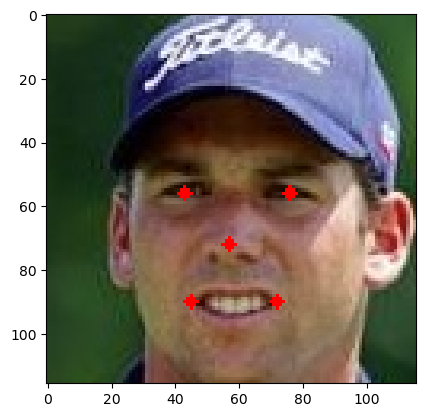

{'data_path': 'raw/80efbf60-c90c-11ed-9720-a2d46b2f7ca3.jpg', 'box': [0.15789473684210525, -0.22105263157894736, 1.0315789473684212, 1.0736842105263158], 'class': 1, 'is_have': 1, 'left_eye': [0.3684210526315789, 0.42105263157894735], 'right_eye': [0.7157894736842105, 0.42105263157894735], 'nose': [0.5157894736842106, 0.5894736842105263], 'mouth_left': [0.3894736842105263, 0.7789473684210526], 'mouth_right': [0.6736842105263158, 0.7789473684210526]}


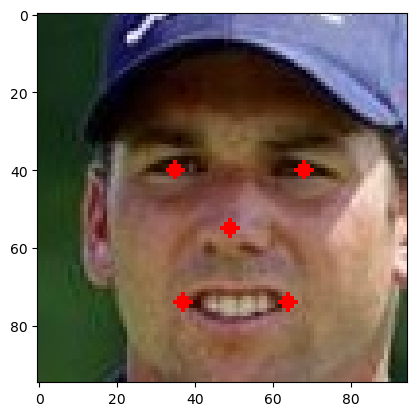

{'data_path': 'raw/80efbf60-c90c-11ed-9720-a2d46b2f7ca3.jpg', 'box': [0.12605042016806722, 0.058823529411764705, 0.8235294117647058, 1.0924369747899159], 'class': 1, 'is_have': 1, 'left_eye': [0.29411764705882354, 0.5714285714285714], 'right_eye': [0.5714285714285714, 0.5714285714285714], 'nose': [0.4117647058823529, 0.7058823529411765], 'mouth_left': [0.31092436974789917, 0.8571428571428571], 'mouth_right': [0.5378151260504201, 0.8571428571428571]}


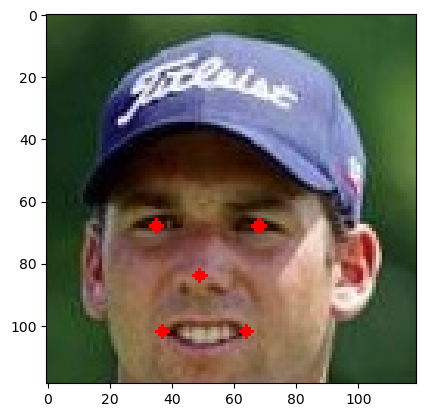

{'data_path': 'raw/80efbf60-c90c-11ed-9720-a2d46b2f7ca3.jpg', 'box': [0.0449438202247191, -0.19101123595505617, 0.9775280898876404, 1.1910112359550562], 'class': 1, 'is_have': 1, 'left_eye': [0.2696629213483146, 0.4943820224719101], 'right_eye': [0.6404494382022472, 0.4943820224719101], 'nose': [0.42696629213483145, 0.6741573033707865], 'mouth_left': [0.29213483146067415, 0.8764044943820225], 'mouth_right': [0.5955056179775281, 0.8764044943820225]}


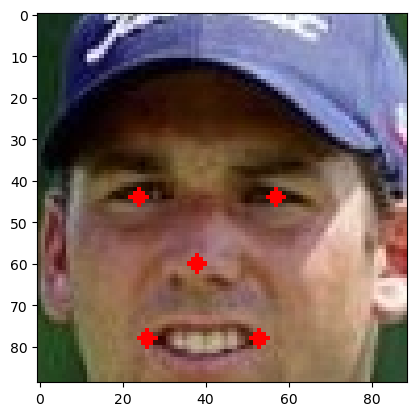

{'data_path': 'raw/80f02950-c90c-11ed-9720-a2d46b2f7ca3.jpg', 'box': [0.1813186813186813, 0.04945054945054945, 0.8186813186813187, 1.0], 'class': 1, 'is_have': 1, 'left_eye': [0.47802197802197804, 0.46703296703296704], 'right_eye': [0.7087912087912088, 0.45054945054945056], 'nose': [0.6758241758241759, 0.5879120879120879], 'mouth_left': [0.5164835164835165, 0.7637362637362637], 'mouth_right': [0.7252747252747253, 0.7472527472527473]}


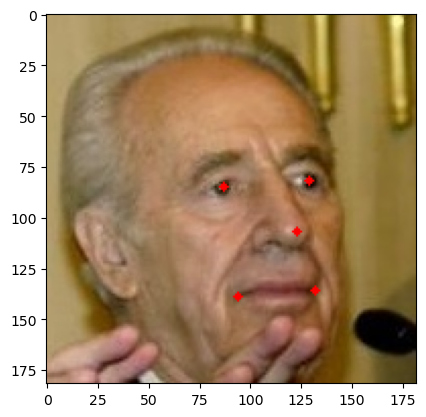

{'data_path': 'raw/80f02950-c90c-11ed-9720-a2d46b2f7ca3.jpg', 'box': [0.05303030303030303, 0.045112781954887216, 0.9318181818181818, 1.3458646616541354], 'class': 1, 'is_have': 1, 'left_eye': [0.4621212121212121, 0.6165413533834586], 'right_eye': [0.7803030303030303, 0.5939849624060151], 'nose': [0.7348484848484849, 0.7819548872180451], 'mouth_left': [0.5151515151515151, 1.0225563909774436], 'mouth_right': [0.803030303030303, 1.0]}


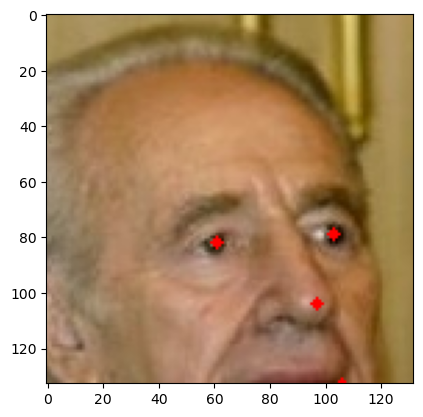

{'data_path': 'raw/80f02950-c90c-11ed-9720-a2d46b2f7ca3.jpg', 'box': [0.02, -0.026490066225165563, 0.7933333333333333, 1.119205298013245], 'class': 1, 'is_have': 1, 'left_eye': [0.38, 0.4768211920529801], 'right_eye': [0.66, 0.45695364238410596], 'nose': [0.62, 0.6225165562913907], 'mouth_left': [0.4266666666666667, 0.8344370860927153], 'mouth_right': [0.68, 0.8145695364238411]}


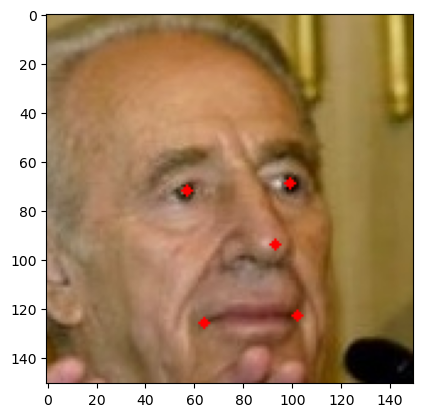

{'data_path': 'raw/80f02950-c90c-11ed-9720-a2d46b2f7ca3.jpg', 'box': [-0.06293706293706294, -0.0625, 0.7482517482517482, 1.1388888888888888], 'class': 1, 'is_have': 1, 'left_eye': [0.3146853146853147, 0.4652777777777778], 'right_eye': [0.6083916083916084, 0.4444444444444444], 'nose': [0.5664335664335665, 0.6180555555555556], 'mouth_left': [0.36363636363636365, 0.8402777777777778], 'mouth_right': [0.6293706293706294, 0.8194444444444444]}


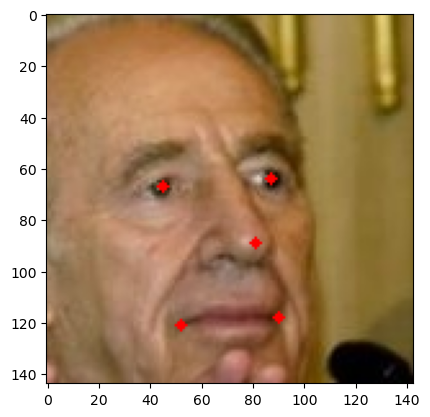

{'data_path': 'raw/80f092a0-c90c-11ed-9720-a2d46b2f7ca3.jpg', 'box': [0.12686567164179105, -0.05223880597014925, 0.835820895522388, 1.0671641791044777], 'class': 1, 'is_have': 1, 'left_eye': [0.3656716417910448, 0.48507462686567165], 'right_eye': [0.664179104477612, 0.5], 'nose': [0.5373134328358209, 0.6343283582089553], 'mouth_left': [0.3358208955223881, 0.7686567164179104], 'mouth_right': [0.6567164179104478, 0.7835820895522388]}


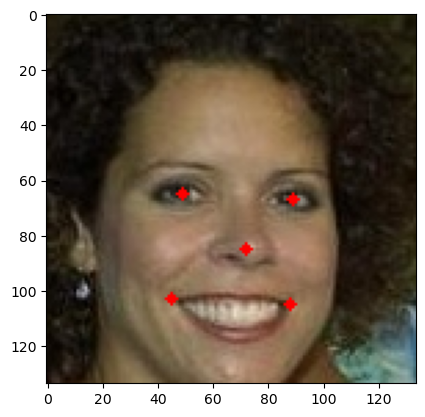

{'data_path': 'raw/80f092a0-c90c-11ed-9720-a2d46b2f7ca3.jpg', 'box': [0.16083916083916083, -0.027972027972027972, 0.8251748251748252, 1.020979020979021], 'class': 1, 'is_have': 1, 'left_eye': [0.38461538461538464, 0.4755244755244755], 'right_eye': [0.6643356643356644, 0.48951048951048953], 'nose': [0.5454545454545454, 0.6153846153846154], 'mouth_left': [0.35664335664335667, 0.7412587412587412], 'mouth_right': [0.6573426573426573, 0.7552447552447552]}


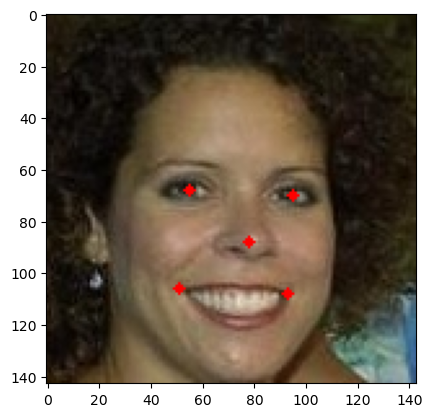

{'data_path': 'raw/80f092a0-c90c-11ed-9720-a2d46b2f7ca3.jpg', 'box': [0.0, -0.08333333333333333, 0.8333333333333334, 1.1041666666666667], 'class': 1, 'is_have': 1, 'left_eye': [0.23958333333333334, 0.5416666666666666], 'right_eye': [0.5625, 0.4479166666666667], 'nose': [0.4375, 0.6770833333333334], 'mouth_left': [0.34375, 0.8541666666666666], 'mouth_right': [0.65625, 0.75]}


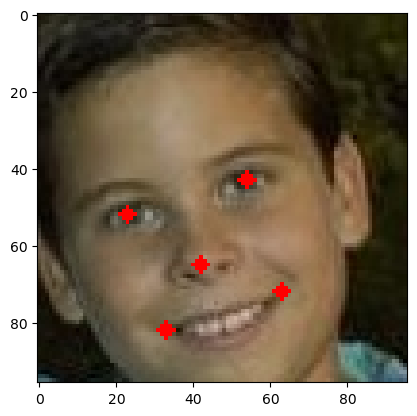

{'data_path': 'raw/80f092a0-c90c-11ed-9720-a2d46b2f7ca3.jpg', 'box': [0.0625, -0.36607142857142855, 0.9107142857142857, 0.9732142857142857], 'class': 1, 'is_have': 1, 'left_eye': [0.3482142857142857, 0.2767857142857143], 'right_eye': [0.7053571428571429, 0.29464285714285715], 'nose': [0.5535714285714286, 0.45535714285714285], 'mouth_left': [0.3125, 0.6160714285714286], 'mouth_right': [0.6964285714285714, 0.6339285714285714]}


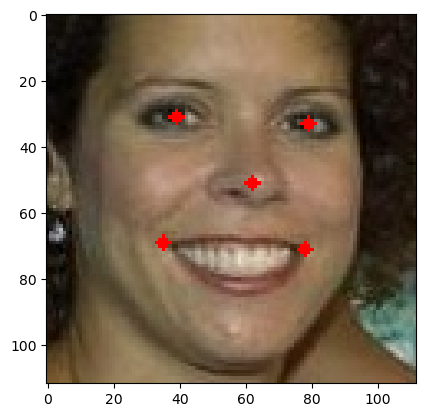

{'data_path': 'raw/80f092a0-c90c-11ed-9720-a2d46b2f7ca3.jpg', 'box': [0.12037037037037036, -0.22935779816513763, 1.0, 1.146788990825688], 'class': 1, 'is_have': 1, 'left_eye': [0.4166666666666667, 0.43119266055045874], 'right_eye': [0.7870370370370371, 0.44954128440366975], 'nose': [0.6296296296296297, 0.6146788990825688], 'mouth_left': [0.37962962962962965, 0.7798165137614679], 'mouth_right': [0.7777777777777778, 0.7981651376146789]}


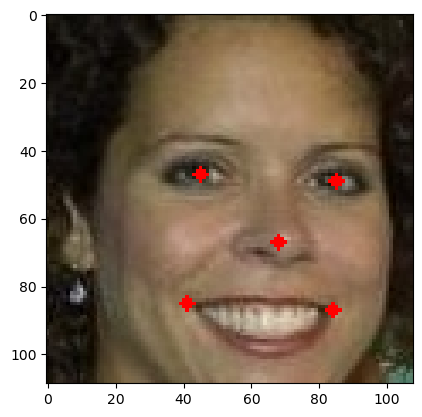

{'data_path': 'raw/80f092a0-c90c-11ed-9720-a2d46b2f7ca3.jpg', 'box': [-0.07317073170731707, -0.12195121951219512, 0.9024390243902439, 1.2682926829268293], 'class': 1, 'is_have': 1, 'left_eye': [0.2073170731707317, 0.6097560975609756], 'right_eye': [0.5853658536585366, 0.5], 'nose': [0.43902439024390244, 0.7682926829268293], 'mouth_left': [0.32926829268292684, 0.975609756097561], 'mouth_right': [0.6951219512195121, 0.8536585365853658]}


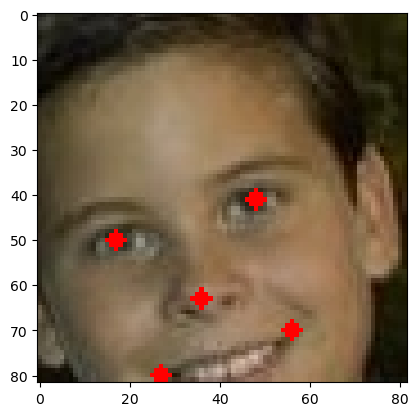

{'data_path': 'raw/80f092a0-c90c-11ed-9720-a2d46b2f7ca3.jpg', 'box': [0.16551724137931034, 0.0, 0.8206896551724138, 1.0344827586206897], 'class': 1, 'is_have': 1, 'left_eye': [0.38620689655172413, 0.496551724137931], 'right_eye': [0.6620689655172414, 0.5103448275862069], 'nose': [0.5448275862068965, 0.6344827586206897], 'mouth_left': [0.3586206896551724, 0.7586206896551724], 'mouth_right': [0.6551724137931034, 0.7724137931034483]}


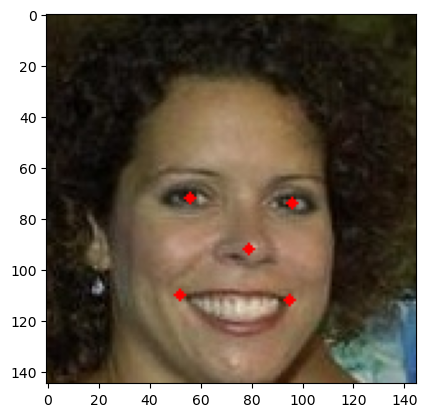

{'data_path': 'raw/80f092a0-c90c-11ed-9720-a2d46b2f7ca3.jpg', 'box': [0.10569105691056911, -0.08196721311475409, 0.8780487804878049, 1.1475409836065573], 'class': 1, 'is_have': 1, 'left_eye': [0.36585365853658536, 0.5081967213114754], 'right_eye': [0.6910569105691057, 0.5245901639344263], 'nose': [0.5528455284552846, 0.6721311475409836], 'mouth_left': [0.3333333333333333, 0.819672131147541], 'mouth_right': [0.6829268292682927, 0.8360655737704918]}


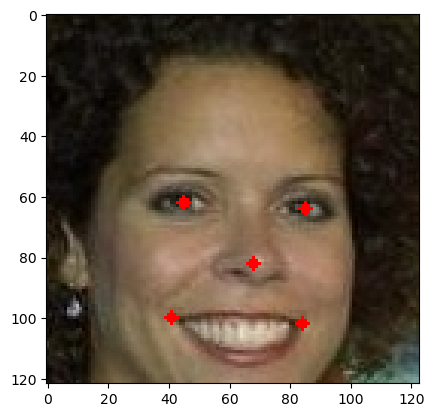

{'data_path': 'raw/80f092a0-c90c-11ed-9720-a2d46b2f7ca3.jpg', 'box': [0.12844036697247707, -0.046296296296296294, 0.8623853211009175, 1.0092592592592593], 'class': 1, 'is_have': 1, 'left_eye': [0.3394495412844037, 0.5092592592592593], 'right_eye': [0.6238532110091743, 0.42592592592592593], 'nose': [0.5137614678899083, 0.6296296296296297], 'mouth_left': [0.43119266055045874, 0.7870370370370371], 'mouth_right': [0.7064220183486238, 0.6944444444444444]}


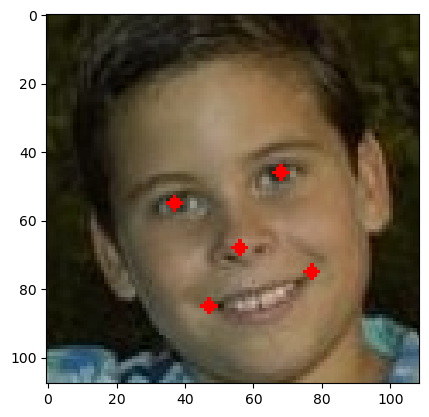

{'data_path': 'raw/80f092a0-c90c-11ed-9720-a2d46b2f7ca3.jpg', 'box': [0.11206896551724138, 0.008547008547008548, 0.8017241379310345, 0.9829059829059829], 'class': 1, 'is_have': 1, 'left_eye': [0.3103448275862069, 0.5213675213675214], 'right_eye': [0.5775862068965517, 0.4444444444444444], 'nose': [0.47413793103448276, 0.6324786324786325], 'mouth_left': [0.39655172413793105, 0.7777777777777778], 'mouth_right': [0.6551724137931034, 0.6923076923076923]}


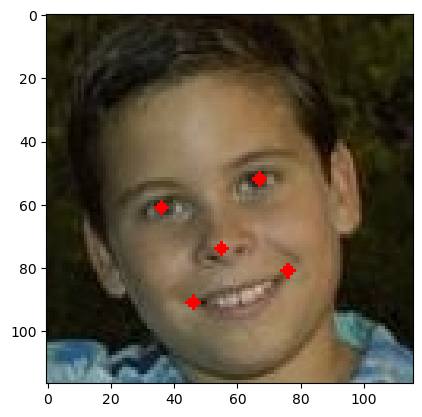

{'data_path': 'raw/80f092a0-c90c-11ed-9720-a2d46b2f7ca3.jpg', 'box': [0.06060606060606061, -0.09774436090225563, 0.7803030303030303, 1.0300751879699248], 'class': 1, 'is_have': 1, 'left_eye': [0.30303030303030304, 0.44360902255639095], 'right_eye': [0.6060606060606061, 0.45864661654135336], 'nose': [0.4772727272727273, 0.5939849624060151], 'mouth_left': [0.2727272727272727, 0.7293233082706767], 'mouth_right': [0.5984848484848485, 0.7443609022556391]}


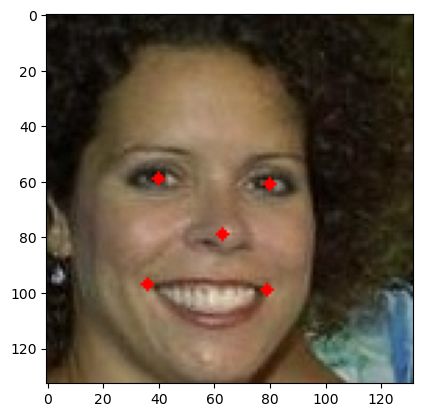

{'data_path': 'raw/80f092a0-c90c-11ed-9720-a2d46b2f7ca3.jpg', 'box': [0.024390243902439025, -0.04878048780487805, 1.0, 1.3414634146341464], 'class': 1, 'is_have': 1, 'left_eye': [0.3048780487804878, 0.6829268292682927], 'right_eye': [0.6829268292682927, 0.573170731707317], 'nose': [0.5365853658536586, 0.8414634146341463], 'mouth_left': [0.4268292682926829, 1.048780487804878], 'mouth_right': [0.7926829268292683, 0.926829268292683]}


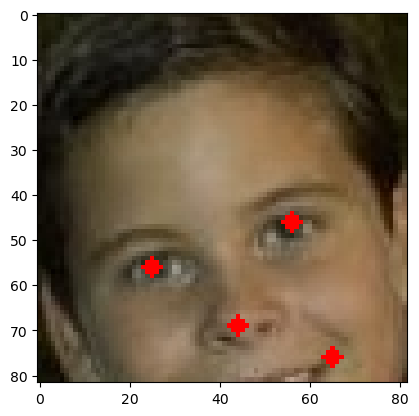

{'data_path': 'raw/80f0e58e-c90c-11ed-9720-a2d46b2f7ca3.jpg', 'box': [0.14563106796116504, -0.058823529411764705, 0.8737864077669902, 1.0588235294117647], 'class': 1, 'is_have': 1, 'left_eye': [0.3106796116504854, 0.5098039215686274], 'right_eye': [0.6019417475728155, 0.47058823529411764], 'nose': [0.42718446601941745, 0.6568627450980392], 'mouth_left': [0.36893203883495146, 0.8431372549019608], 'mouth_right': [0.6019417475728155, 0.8137254901960784]}


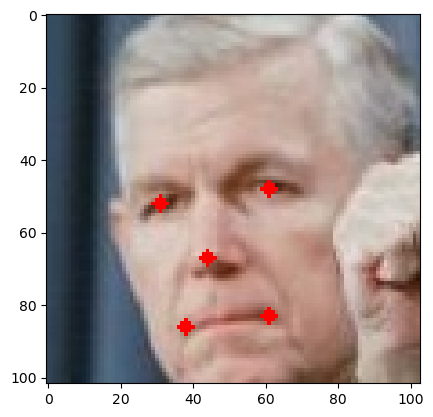

{'data_path': 'raw/80f0e58e-c90c-11ed-9720-a2d46b2f7ca3.jpg', 'box': [0.0673076923076923, -0.17475728155339806, 0.9230769230769231, 1.0485436893203883], 'class': 1, 'is_have': 1, 'left_eye': [0.2403846153846154, 0.42718446601941745], 'right_eye': [0.4807692307692308, 0.39805825242718446], 'nose': [0.28846153846153844, 0.6019417475728155], 'mouth_left': [0.3076923076923077, 0.7864077669902912], 'mouth_right': [0.5096153846153846, 0.7572815533980582]}


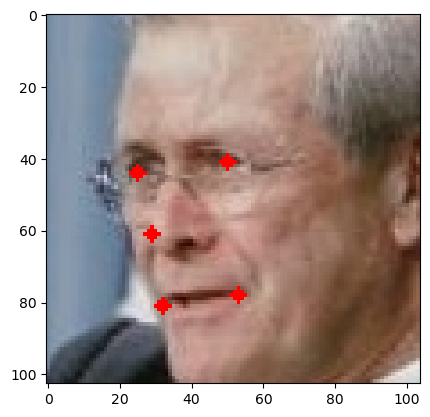

{'data_path': 'raw/80f0e58e-c90c-11ed-9720-a2d46b2f7ca3.jpg', 'box': [0.13793103448275862, -0.017241379310344827, 0.9051724137931034, 1.0689655172413792], 'class': 1, 'is_have': 1, 'left_eye': [0.29310344827586204, 0.5172413793103449], 'right_eye': [0.5086206896551724, 0.49137931034482757], 'nose': [0.33620689655172414, 0.6724137931034483], 'mouth_left': [0.35344827586206895, 0.8362068965517241], 'mouth_right': [0.5344827586206896, 0.8103448275862069]}


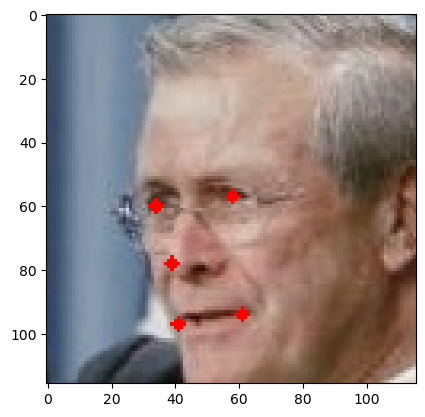

{'data_path': 'raw/80f0e58e-c90c-11ed-9720-a2d46b2f7ca3.jpg', 'box': [0.16260162601626016, 0.0, 0.8861788617886179, 1.024390243902439], 'class': 1, 'is_have': 1, 'left_eye': [0.3089430894308943, 0.5040650406504065], 'right_eye': [0.5121951219512195, 0.4796747967479675], 'nose': [0.34959349593495936, 0.6504065040650406], 'mouth_left': [0.36585365853658536, 0.8048780487804879], 'mouth_right': [0.5365853658536586, 0.7804878048780488]}


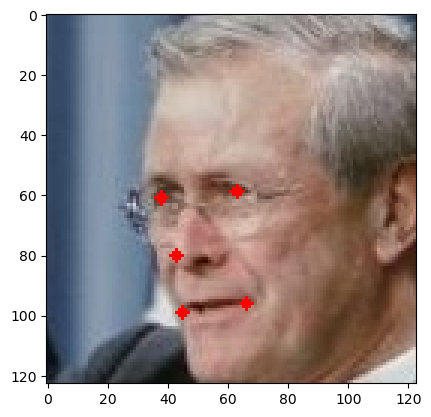

{'data_path': 'raw/80f0e58e-c90c-11ed-9720-a2d46b2f7ca3.jpg', 'box': [0.1188118811881188, -0.13861386138613863, 1.0, 1.108910891089109], 'class': 1, 'is_have': 1, 'left_eye': [0.297029702970297, 0.4752475247524752], 'right_eye': [0.5445544554455446, 0.44554455445544555], 'nose': [0.3465346534653465, 0.6534653465346535], 'mouth_left': [0.36633663366336633, 0.8415841584158416], 'mouth_right': [0.5742574257425742, 0.8118811881188119]}


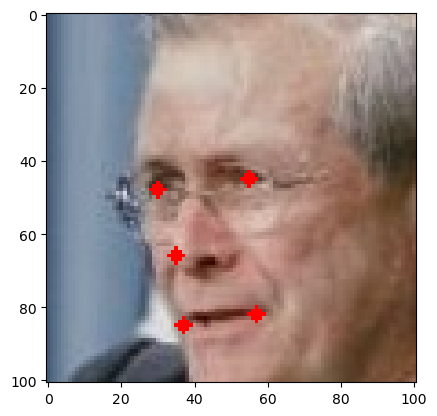

{'data_path': 'raw/80f0e58e-c90c-11ed-9720-a2d46b2f7ca3.jpg', 'box': [0.1134020618556701, -0.09183673469387756, 0.8865979381443299, 1.0714285714285714], 'class': 1, 'is_have': 1, 'left_eye': [0.28865979381443296, 0.5], 'right_eye': [0.5979381443298969, 0.45918367346938777], 'nose': [0.41237113402061853, 0.6530612244897959], 'mouth_left': [0.35051546391752575, 0.8469387755102041], 'mouth_right': [0.5979381443298969, 0.8163265306122449]}


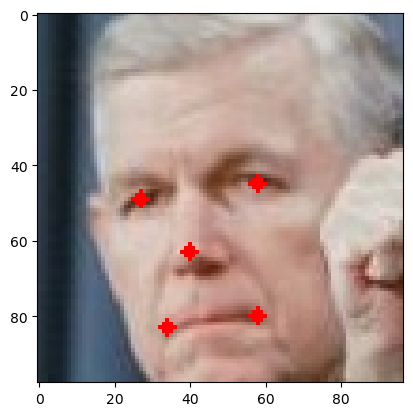

{'data_path': 'raw/80f0e58e-c90c-11ed-9720-a2d46b2f7ca3.jpg', 'box': [0.06, -0.17, 0.95, 1.09], 'class': 1, 'is_have': 1, 'left_eye': [0.24, 0.45], 'right_eye': [0.49, 0.42], 'nose': [0.29, 0.63], 'mouth_left': [0.31, 0.82], 'mouth_right': [0.52, 0.79]}


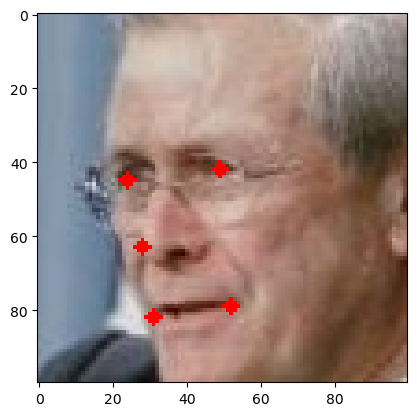

{'data_path': 'raw/80f0e58e-c90c-11ed-9720-a2d46b2f7ca3.jpg', 'box': [0.0, -0.4418604651162791, 1.0348837209302326, 1.0232558139534884], 'class': 1, 'is_have': 1, 'left_eye': [0.20930232558139536, 0.27906976744186046], 'right_eye': [0.5, 0.2441860465116279], 'nose': [0.26744186046511625, 0.4883720930232558], 'mouth_left': [0.29069767441860467, 0.7093023255813954], 'mouth_right': [0.5348837209302325, 0.6744186046511628]}


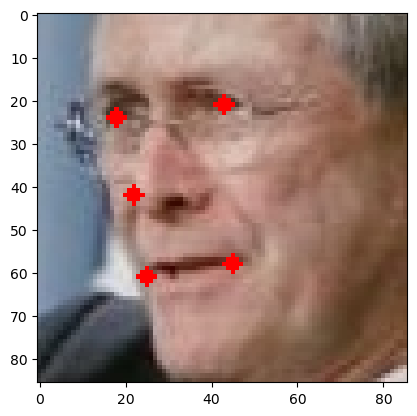

{'data_path': 'raw/80f13606-c90c-11ed-9720-a2d46b2f7ca3.jpg', 'box': [0.1858974358974359, -0.04501607717041801, 0.8397435897435898, 1.0], 'class': 1, 'is_have': 1, 'left_eye': [0.42628205128205127, 0.4855305466237942], 'right_eye': [0.6826923076923077, 0.5337620578778135], 'nose': [0.5705128205128205, 0.684887459807074], 'mouth_left': [0.38782051282051283, 0.7813504823151125], 'mouth_right': [0.6185897435897436, 0.819935691318328]}


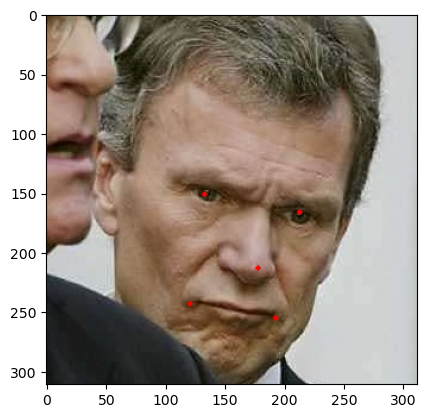

{'data_path': 'raw/80f13606-c90c-11ed-9720-a2d46b2f7ca3.jpg', 'box': [0.16071428571428573, -0.08896797153024912, 0.8892857142857142, 1.0676156583629892], 'class': 1, 'is_have': 1, 'left_eye': [0.42857142857142855, 0.498220640569395], 'right_eye': [0.7142857142857143, 0.5516014234875445], 'nose': [0.5892857142857143, 0.7188612099644128], 'mouth_left': [0.38571428571428573, 0.8256227758007118], 'mouth_right': [0.6428571428571429, 0.8683274021352313]}


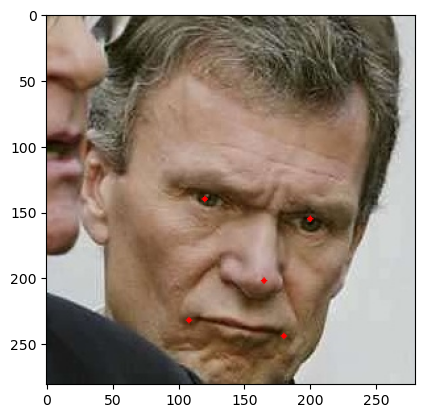

{'data_path': 'raw/80f13606-c90c-11ed-9720-a2d46b2f7ca3.jpg', 'box': [0.08267716535433071, -0.30708661417322836, 0.8858267716535433, 0.9724409448818898], 'class': 1, 'is_have': 1, 'left_eye': [0.3779527559055118, 0.3425196850393701], 'right_eye': [0.6929133858267716, 0.4015748031496063], 'nose': [0.5551181102362205, 0.5866141732283464], 'mouth_left': [0.33070866141732286, 0.7047244094488189], 'mouth_right': [0.6141732283464567, 0.7519685039370079]}


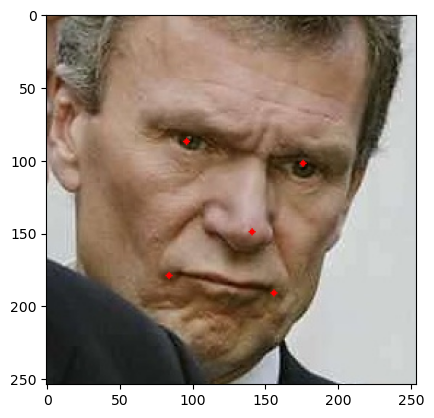

{'data_path': 'raw/80f13606-c90c-11ed-9720-a2d46b2f7ca3.jpg', 'box': [0.06640625, -0.1640625, 0.86328125, 1.10546875], 'class': 1, 'is_have': 1, 'left_eye': [0.359375, 0.48046875], 'right_eye': [0.671875, 0.5390625], 'nose': [0.53515625, 0.72265625], 'mouth_left': [0.3125, 0.83984375], 'mouth_right': [0.59375, 0.88671875]}


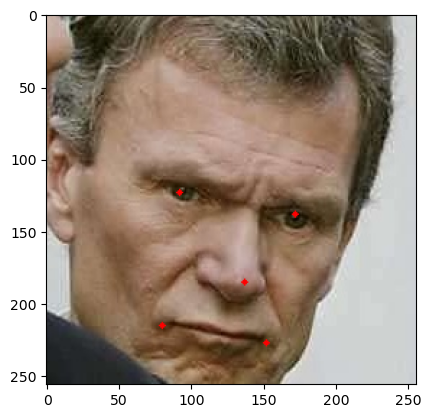

{'data_path': 'raw/80f181a6-c90c-11ed-9720-a2d46b2f7ca3.jpg', 'box': [0.08074534161490683, -0.07453416149068323, 0.8198757763975155, 1.0372670807453417], 'class': 1, 'is_have': 1, 'left_eye': [0.34782608695652173, 0.515527950310559], 'right_eye': [0.6211180124223602, 0.4472049689440994], 'nose': [0.5341614906832298, 0.6459627329192547], 'mouth_left': [0.4409937888198758, 0.8136645962732919], 'mouth_right': [0.6708074534161491, 0.7639751552795031]}


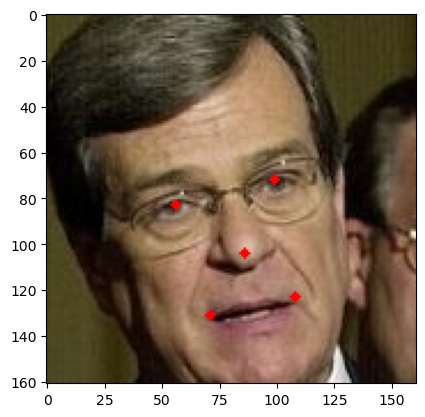

{'data_path': 'raw/80f181a6-c90c-11ed-9720-a2d46b2f7ca3.jpg', 'box': [0.052980132450331126, -0.10596026490066225, 0.8410596026490066, 1.0794701986754967], 'class': 1, 'is_have': 1, 'left_eye': [0.33774834437086093, 0.5231788079470199], 'right_eye': [0.6291390728476821, 0.4503311258278146], 'nose': [0.5364238410596026, 0.6622516556291391], 'mouth_left': [0.4370860927152318, 0.8410596026490066], 'mouth_right': [0.6821192052980133, 0.7880794701986755]}


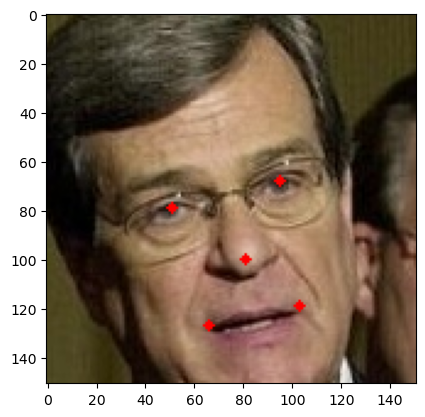

{'data_path': 'raw/80f181a6-c90c-11ed-9720-a2d46b2f7ca3.jpg', 'box': [0.02142857142857143, -0.15714285714285714, 0.8714285714285714, 1.1214285714285714], 'class': 1, 'is_have': 1, 'left_eye': [0.32857142857142857, 0.5214285714285715], 'right_eye': [0.6428571428571429, 0.44285714285714284], 'nose': [0.5428571428571428, 0.6714285714285714], 'mouth_left': [0.4357142857142857, 0.8642857142857143], 'mouth_right': [0.7, 0.8071428571428572]}


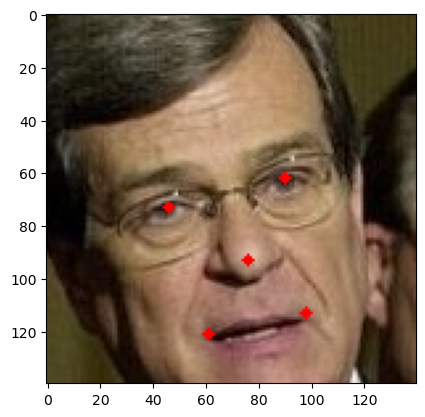

{'data_path': 'raw/80f181a6-c90c-11ed-9720-a2d46b2f7ca3.jpg', 'box': [0.07633587786259542, -0.0896551724137931, 0.8015267175572519, 0.9862068965517241], 'class': 1, 'is_have': 1, 'left_eye': [0.3282442748091603, 0.4206896551724138], 'right_eye': [0.6564885496183206, 0.45517241379310347], 'nose': [0.5114503816793893, 0.6275862068965518], 'mouth_left': [0.3282442748091603, 0.7793103448275862], 'mouth_right': [0.5801526717557252, 0.8]}


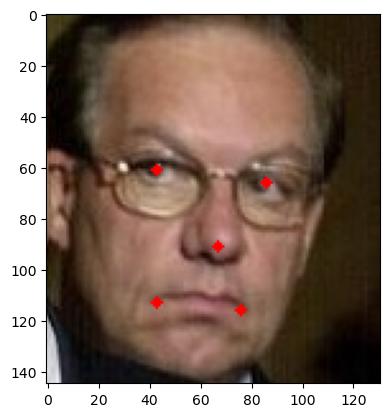

{'data_path': 'raw/80f181a6-c90c-11ed-9720-a2d46b2f7ca3.jpg', 'box': [0.0979020979020979, -0.21678321678321677, 0.9300699300699301, 1.034965034965035], 'class': 1, 'is_have': 1, 'left_eye': [0.3986013986013986, 0.44755244755244755], 'right_eye': [0.7062937062937062, 0.3706293706293706], 'nose': [0.6083916083916084, 0.5944055944055944], 'mouth_left': [0.5034965034965035, 0.7832167832167832], 'mouth_right': [0.7622377622377622, 0.7272727272727273]}


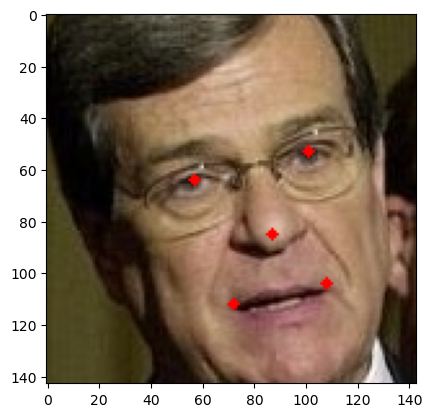

{'data_path': 'raw/80f181a6-c90c-11ed-9720-a2d46b2f7ca3.jpg', 'box': [0.15760869565217392, 0.02717391304347826, 0.8043478260869565, 1.0], 'class': 1, 'is_have': 1, 'left_eye': [0.391304347826087, 0.5434782608695652], 'right_eye': [0.6304347826086957, 0.483695652173913], 'nose': [0.5543478260869565, 0.657608695652174], 'mouth_left': [0.47282608695652173, 0.8043478260869565], 'mouth_right': [0.6739130434782609, 0.7608695652173914]}


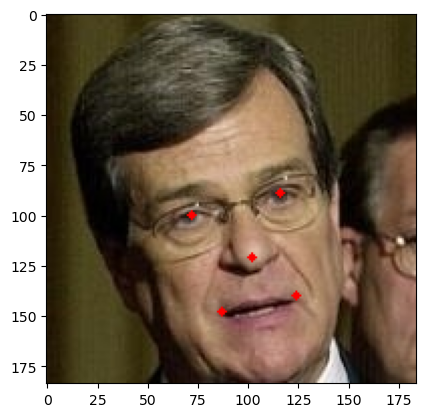

{'data_path': 'raw/80f181a6-c90c-11ed-9720-a2d46b2f7ca3.jpg', 'box': [0.1597222222222222, -0.039473684210526314, 0.8194444444444444, 0.9868421052631579], 'class': 1, 'is_have': 1, 'left_eye': [0.3888888888888889, 0.4473684210526316], 'right_eye': [0.6875, 0.48026315789473684], 'nose': [0.5555555555555556, 0.6447368421052632], 'mouth_left': [0.3888888888888889, 0.7894736842105263], 'mouth_right': [0.6180555555555556, 0.8092105263157895]}


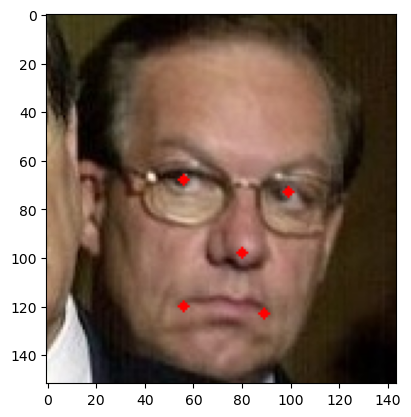

{'data_path': 'raw/80f181a6-c90c-11ed-9720-a2d46b2f7ca3.jpg', 'box': [0.12949640287769784, -0.11428571428571428, 0.8129496402877698, 1.0], 'class': 1, 'is_have': 1, 'left_eye': [0.3669064748201439, 0.4142857142857143], 'right_eye': [0.6762589928057554, 0.45], 'nose': [0.539568345323741, 0.6285714285714286], 'mouth_left': [0.3669064748201439, 0.7857142857142857], 'mouth_right': [0.60431654676259, 0.8071428571428572]}


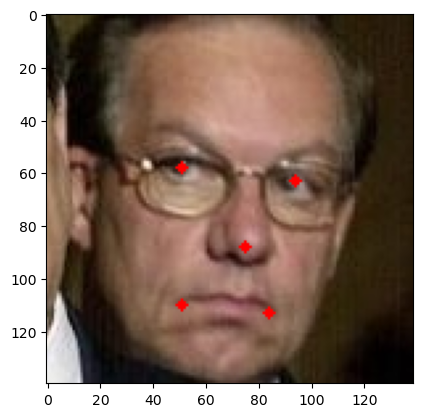

In [10]:
print(FOLDER)
root = os.path.join('o_hard_sample', FOLDER, 'face')
clab_path = os.listdir(root)
clab_path = sorted([file for file in clab_path if file.split('.')[-1] == 'json']) 
landmark_list = ['right_eye', 'left_eye', 'nose', 'mouth_left', 'mouth_right']

for i, lab_load in enumerate(clab_path):
    lab_load = os.path.join(root, lab_load)
    lab = json.load(open(lab_load, 'r'))
    print(lab)
    
    img_load = lab_load.split('.')[0] + '.jpg'
    img   = cv2.cvtColor(cv2.imread(img_load), cv2.COLOR_BGR2RGB)

    draw_img = copy.deepcopy(img)

    
    for k in lab:
        if k in landmark_list:
            cv2.circle(draw_img, 
                       (int(lab[k][0]*img.shape[1]), 
                        int(lab[k][1]*img.shape[0])),
                        2,
                       [255, 0,0], -1)
    plt.imshow(draw_img)
    plt.show()
    
    if i == 100:
        break